In [3]:
from sklearn import preprocessing
import pandas as pd
import numpy as np
class myPandasClass():
    def __init__(self):
        self.df = None
    
    def read_csv(self, file):
        self.df = pd.read_csv(file)
        return self.df
    
    def sort_values_by_column(self, column):    
        return self.df.sort_values(by=column)
    
    def filter_data_by_bound(self, column:str, lower_bound, upper_bound):
        self.df = self.df.loc[lambda x: (x[column] >= lower_bound)]
        self.df = self.df.loc[lambda x: (x[column] < upper_bound)]        
        return self.df
    
    
    def remove_column(self, column:str):
        self.df = self.df.drop(column, axis=1)
        return self.df
    
    def insert_column(self, old_column:str, newcolumn:str):
        self.df[newcolumn] = self.df[old_column].apply(lambda x: 0.0)
        return self.df
    
    def insert_column_with_normalize(self, old_column:str, newcolumn:str, divide_factor: 1.0):
        if (divide_factor > 0):
            self.df[newcolumn] = self.df[old_column].apply(lambda x: x / divide_factor)
        else:
            self.df[newcolumn] = self.df[old_column].apply(lambda x: 0.0)
        return self.df
    
    def convert_all_column_names_to_lower_case(self):
        self.df = self.df.rename(columns=str.lower)
        return self.df
    
    def scale(self, column:str):
        self.df[column] = preprocessing.scale(self.df[column])
        return self.df
    
    def binarizer(self, column:str):
        binarizer  = preprocessing.Binarizer().fit([self.df[column]])
        a =  binarizer.transform([self.df[column]])
        self.df[column] = pd.Series(a.flatten())
        return self.df
    
    def normalize(self, column:str):
        X_normalized = preprocessing.normalize([self.df[column]], norm='l1')
        self.df[column] = pd.Series(X_normalized.flatten())
        return self.df
    #X_normalized = preprocessing.normalize(X, norm='l2')
            

In [4]:
import numpy as np
import matplotlib.pyplot as plt  # from matplotlib import pyplot as plt
%matplotlib inline

class myPlotClass:
    def __init__(self, x, y, grid = False):
        self.x = x #data trục ngang
        self.y = y #data trục dọc
        self.grid = grid
        
    #https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html#matplotlib.pyplot.plot
    def plot_simple(self, title = '<title>', xlabel = '<xlabel>', ylabel = '<ylabel>'):
        plt.figure(figsize=(8, 5))
        # 
        plt.plot(self.x, self.y, label='quadratic', color='r', marker='o')
        #
                
        plt.grid(self.grid)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        plt.show()
        
    #https://matplotlib.org/api/_as_gen/matplotlib.pyplot.scatter.html#matplotlib.pyplot.scatter    
    def plot_scatter(self, title = '<title>', xlabel = '<xlabel>', ylabel = '<ylabel>', color = None):
        plt.figure(figsize=(10, 10)) 
        
        c = np.random.randint(0, self.x.shape[0] , self.x.shape[0])
        if (color is not None):
            c = color
            plt.scatter(self.x, self.y, c = c, s=100, alpha=0.5)
        else:
            plt.scatter(self.x, self.y, s=100, alpha=0.5)
        #---------------------------------------  
        
        #
               
        plt.grid(self.grid)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        plt.show()
        
     #Histogram
     #https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html#matplotlib.pyplot.hist
    def plot_histogram(self, title = '<title>', xlabel = '<xlabel>', ylabel = '<ylabel>', color = None):
        plt.figure(figsize=(10,8))
        #    
        plt.figure(figsize=(10, 10))
        
        plt.hist(x)
       # plt.axis([17, 38, 0, 110])  # set viewport of the axes.

        plt.grid(self.grid)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        plt.show()    

# Load dataset

In [5]:
#X_train is     [n_samples, n_features]
#y_train is     [n_samples, ]               (--> mỗi 1 samples có 1 kết quả)
#y_train_enc    [n_samples, n_output]       ( = n_classlabels)

#self.b_h is    [n_hidden, ]
#self.w_h is    [n_features, n_hidden]      ( số cột của mẫu)
#self.b_out is  [n_output, ]                 ( = n_classlabels)
#self.w_out is  [n_hidden, n_output]         ( = n_classlabels)

#z_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.z_h )
#a_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.a_h )
#z_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.z_out )
#a_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.a_out )

#self.z_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
#self.a_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
#self.z_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )
#self.a_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )

import sys
import gzip
import shutil
import os
import struct
import numpy as np
import matplotlib.pyplot as plt
class HousePricePredict(object):
    """ Feedforward neural network / Multi-layer perceptron classifier.

    Parameters
    ------------
    n_hidden : int (default: 30)
        Number of hidden units.
    l2 : float (default: 0.)
        Lambda value for L2-regularization.
        No regularization if l2=0. (default)
    epochs : int (default: 100)
        Number of passes over the training set.
    eta : float (default: 0.001)
        Learning rate.
    shuffle : bool (default: True)
        Shuffles training data every epoch if True to prevent circles.
    minibatch_size : int (default: 1)
        Number of training samples per minibatch.
    seed : int (default: None)
        Random seed for initalizing weights and shuffling.

    Attributes
    -----------
    eval_ : dict
      Dictionary collecting the cost, training accuracy,
      and validation accuracy for each epoch during training.

    """
    def __init__(self, n_hidden=30,
                 l2=0., epochs=100, eta=0.001,
                 shuffle=True, minibatch_size=1, seed=None):

        self.random = np.random.RandomState(seed)
        self.n_hidden = n_hidden
        self.l2 = l2
        self.epochs = epochs
        self.eta = eta
        self.shuffle = shuffle
        self.minibatch_size = minibatch_size
    
    def _onehot(self, y, n_classes):
        """Encode labels into one-hot representation

        Parameters
        ------------
        y : array, shape = [n_samples]
            Target values.

        Returns
        -----------
        onehot : array, shape = (n_samples, n_labels)

        """
        onehot = np.zeros((n_classes, y.shape[0])) #(1, 1400)
        print(y)
        for idx, val in enumerate(y.astype(int)):
            onehot[val, idx] = 1.
            print('val, idx = {}, {} --> {}'.format(val, idx, onehot[val, idx]))
        return onehot.T
    
    def _format_out(self, y, n_classes):
        """Encode labels into one-hot representation

        Parameters
        ------------
        y : array, shape = [n_samples]
            Target values.

        Returns
        -----------
        onehot : array, shape = (n_samples, n_labels)

        """
        #onehot = np.zeros((n_classes, y.shape[0])) #(1, 1400)
        #print('kkkk {}'.format((onehot.shape)))  #idx, val = 0, [208500]
        #print(onehot)
        #print('aaa: {}'.format(y.astype(int)))
        #for idx in range(y.shape[0]):
         #   onehot[val, idx] = 1.
        
        #(1, 1400)
        
        #for idx, val in enumerate(y.astype(int)):
            #print('idx, val = {}, {}'.format(idx, val))
            #onehot[val, idx] = 1.
            #onehot[idx, idx] = val
               #print('val, idx = {}, {} --> {}'.format(val, idx, onehot[val, idx]))
        onehot = y.reshape(1, -1)  
        return onehot.T
    
    
    
    def _sigmoid(self, z):
        """Compute logistic function (sigmoid)"""
        #return 1. / (1. + np.exp(-np.clip(z, -250, 250)))
        return 1. / (1. + np.exp(-z))
    
    
    def _compute_cost_CrossEntropy(self, y_enc, output):
        L2_term = (self.l2 *
                   (np.sum(self.w_h ** 2.) +
                    np.sum(self.w_out ** 2.)))

        term1 = -y_enc * (np.log(output + 1e-5))
        term2 = (1. - y_enc) * np.log(1. - output + 1e-5)
        cost = np.sum(term1 - term2) + L2_term
        return cost;
    
    
    def _compute_cost_MSE(self, y_enc, output):
        #sq_error = (output.flatten() - y_enc.flatten())**2
        sq_error = (output - y_enc)**2
        n = output.shape[0]
        cost = 1.0 / (2*n) * sq_error.sum()
        return cost;
    
        
    #Loss Cross-Entropy
    def _compute_cost(self, y_enc, output):
        """Compute cost function.

        Parameters
        ----------
        y_enc : array, shape = (n_samples, n_labels)
            one-hot encoded class labels.
        output : array, shape = [n_samples, n_output_units]
            Activation of the output layer (forward propagation)

        Returns
        ---------
        cost : float
            Regularized cost
        
        """
        #print('_compute_cost start')
        #print(output)
        #L2_term = (self.l2 *
                   #(np.sum(self.w_h ** 2.) +
                   # np.sum(self.w_out ** 2.)))

        #term1 = -y_enc * (np.log(output + 1e-5))
        #term2 = (1. - y_enc) * np.log(1. - output + 1e-5)
        #cost = np.sum(term1 - term2) + L2_term
        #print('_compute_cost end')
        # If you are applying this cost function to other
        # datasets where activation
        # values maybe become more extreme (closer to zero or 1)
        # you may encounter "ZeroDivisionError"s due to numerical
        # instabilities in Python & NumPy for the current implementation.
        # I.e., the code tries to evaluate log(0), which is undefined.
        # To address this issue, you could add a small constant to the
        # activation values that are passed to the log function.
        #
        # For example:
        #
        # term1 = -y_enc * (np.log(output + 1e-5))
        # term2 = (1. - y_enc) * np.log(1. - output + 1e-5)
        #print('output {}'.format(output.shape))
        #print(output)
       # print('y_enc {}'.format(y_enc.shape))
        #sq_error = (output.flatten() - y_enc.flatten())**2
        #n = output.shape[0]
        #cost = 1.0 / (2*n) * sq_error.sum()
        
        cost = self._compute_cost_MSE(y_enc, output)

        return cost
    
    def _forward(self, X):
        # step 1: net input of hidden layer
        # [n_samples, n_features] dot [n_features, n_hidden]
        # -> [n_samples, n_hidden]
        z_h = np.dot(X, self.w_h) + self.b_h   #100 x 100
        
         # step 2: activation of hidden layer
        a_h = self._sigmoid(z_h)
        
        # step 3: net input of output layer
        # [n_samples, n_hidden] dot [n_hidden, n_classlabels]
        # -> [n_samples, n_classlabels]

        z_out = np.dot(a_h, self.w_out) + self.b_out #100 x 10
        
        # step 4: activation output layer
        a_out = self._sigmoid(z_out)
        
        
        #print('z_h shape -- {} {}'.format(z_h.shape, type(z_h)))
        #print('a_h shape -- {} {}'.format(a_h.shape, type(a_h)))
        #print('z_out shape -- {} {}'.format(z_out.shape, type(z_out)))
        #print('a_out shape -- {} {}'.format(a_out.shape, type(z_h)))
        
        return z_h, a_h, z_out, a_out    
    
    
    def predict(self, X):
        """Predict class labels

        Parameters
        -----------
        X : array, shape = [n_samples, n_features]
            Input layer with original features.

        Returns:
        ----------
        y_pred : array, shape = [n_samples]
            Predicted class labels.

        """
        z_h, a_h, z_out, a_out = self._forward(X)
        y_pred = a_out #z_out #np.argmax(z_out, axis=1)
        return y_pred
    
    

        
        
    def fit(self, X_train, y_train, X_valid, y_valid):
        print('y_train -- {} {}'.format(y_train.shape, type(y_train)))
        print('X_train -- {} {}'.format(X_train.shape, type(X_train)))
        #n_output = np.unique(y_train).shape[0]  # number of class labels
        n_output = 1
        
        n_features = X_train.shape[1] #784
        print('n_output -- {} {}'.format(n_output, type(n_output)))
        print('n_features -- {} {}'.format(n_features, type(n_features)))
        print((y_train))
        
        ########################
        # Weight initialization
        ########################
        # weights for input -> hidden
        self.b_h = np.zeros(self.n_hidden)
        self.w_h = self.random.normal(loc=0.0, scale=0.1,
                                      size=(n_features, self.n_hidden))
        
        print('self.b_h -- {} {}'.format(self.b_h.shape, type(self.b_h)))
        print('self.w_h -- {} {}'.format(self.w_h.shape, type(self.w_h)))
        
         # weights for hidden -> output
        self.b_out = np.zeros(n_output)
        self.w_out = self.random.normal(loc=0.0, scale=0.1,
                                        size=(self.n_hidden, n_output))
        
        print('self.b_out -- {} {}'.format(self.b_out.shape, type(self.b_out)))
        print('self.w_out -- {} {}'.format(self.w_out.shape, type(self.w_out)))
        
        #--------------------------------------------------------------------------
        epoch_strlen = len(str(self.epochs))  # for progress formatting
        self.eval_ = {'cost': [], 'train_acc': [], 'valid_acc': []}

        #--------------------------------------------------------------------------
        #y_train_enc = self._onehot(y_train, n_output) #y_train_enc    [n_samples, n_output]       ( = n_classlabels)
        y_train_enc = self._format_out(y_train, n_output)
        
        #print('y_train_enc {}'.format(y_train_enc))
        #print('y_train_enc shape -- {} {}'.format(y_train_enc.shape, type(y_train_enc)))
        
        # iterate over training epochs
        for i in range(self.epochs):
            # iterate over minibatches
            indices = np.arange(X_train.shape[0])
            
            #xáo trộn indices
            if self.shuffle:
                self.random.shuffle(indices)
            
            #xử lý data theo từng batch là minibatch_size
            for start_idx in range(0, indices.shape[0] - self.minibatch_size + 1, self.minibatch_size):
                batch_idx = indices[start_idx:start_idx + self.minibatch_size]
                #print('{}.batch_idx = {}'.format(start_idx, batch_idx))
                
                # forward propagation
               # print('X_train[batch_idx] -- {} {}'.format(X_train[batch_idx].shape, type(X_train[batch_idx])))
                z_h, a_h, z_out, a_out = self._forward(X_train[batch_idx])
                
                #X_train is     [n_samples, n_features]
                #y_train is     [n_samples, ]               (--> mỗi 1 samples có 1 kết quả)
                #y_train_enc    [n_samples, n_output]       ( = n_classlabels)
                
                #self.b_h is    [n_hidden, ]
                #self.w_h is    [n_features, n_hidden]      ( số cột của mẫu)
                #self.b_out is  [n_output, ]                 ( = n_classlabels)
                #self.w_out is  [n_hidden, n_output]         ( = n_classlabels)
                
                #z_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.z_h )
                #a_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.a_h )
                #z_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.z_out )
                #a_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.a_out )
                
                #self.z_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
                #self.a_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
                #self.z_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )
                #self.a_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )
                
                
                
                ##################
                # Backpropagation: (hàm cost: Loss Cross-Entropy )
                ##################
                # [n_samples, n_classlabels]
                sigma_out = a_out - y_train_enc[batch_idx]
                print('sigma_out = {}'.format(y_train_enc[batch_idx]))
                # [n_samples, n_hidden]
                sigmoid_derivative_h = a_h * (1. - a_h) # đạo hàm của hàm sigmoid theo hidden 
                
                
                # [n_samples, n_classlabels] dot [n_classlabels, n_hidden]
                # -> [n_samples, n_hidden]
                sigma_h = (np.dot(sigma_out, self.w_out.T) * sigmoid_derivative_h)
                
                
                # [n_features, n_samples] dot [n_samples, n_hidden]
                # -> [n_features, n_hidden]
                grad_w_h = np.dot(X_train[batch_idx].T, sigma_h)
                grad_b_h = np.sum(sigma_h, axis=0)
                
                # [n_hidden, n_samples] dot [n_samples, n_classlabels]
                # -> [n_hidden, n_classlabels]
                grad_w_out = np.dot(a_h.T, sigma_out)
                grad_b_out = np.sum(sigma_out, axis=0)
                
                
                # Regularization and weight updates
                delta_w_h = (grad_w_h + self.l2*self.w_h)
                delta_b_h = grad_b_h # bias is not regularized
                self.w_h -= self.eta * delta_w_h
                self.b_h -= self.eta * delta_b_h

                delta_w_out = (grad_w_out + self.l2*self.w_out)
                delta_b_out = grad_b_out  # bias is not regularized
                self.w_out -= self.eta * delta_w_out
                self.b_out -= self.eta * delta_b_out
                
                
                #break #to test single 
                
            #############
            # Evaluation
            #############
            # Evaluation after each epoch during training
            z_h, a_h, z_out, a_out = self._forward(X_train)
            cost = self._compute_cost(y_enc=y_train_enc,
                                      output=a_out)
            
            
            y_train_pred = self.predict(X_train)
            y_valid_pred = self.predict(X_valid)
            
            print('y_train_pred = {}'.format(y_train_pred))
            train_acc = ((np.sum(y_train == y_train_pred)).astype(np.float) /
                         X_train.shape[0])
            valid_acc = ((np.sum(y_valid == y_valid_pred)).astype(np.float) /
                         X_valid.shape[0])

            sys.stderr.write('\r%0*d/%d | Cost: %.2f '
                             '| Train/Valid Acc.: %.2f%%/%.2f%% ' %
                             (epoch_strlen, i+1, self.epochs, cost,
                              train_acc*100, valid_acc*100))
            sys.stderr.flush()

            self.eval_['cost'].append(cost)
            self.eval_['train_acc'].append(train_acc)
            self.eval_['valid_acc'].append(valid_acc)
        return self
            

# Load dataset

In [6]:

my_pd = myPandasClass()
df_train = my_pd.read_csv('train.csv') #1460 x 81

df_test = my_pd.read_csv('test.csv') #1459 rows × 80 columns 
#
all_features = pd.concat((df_train.iloc[:, 1:-1], df_test.iloc[:, 1:])) #2919 rows × 79 columns (remove SalePrice)
all_features


#train = pd.read_csv("train.csv")
#train.head()
#test = pd.read_csv("test.csv")

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


# Data Preprocessing

In [7]:
#standardizing
numeric_features = all_features.dtypes[all_features.dtypes != 'object'].index
all_features[numeric_features] = all_features[numeric_features].apply(
    lambda x: (x - x.mean()) / (x.std()))

# After standardizing the data all means vanish, hence we can set missing
# values to 0
all_features[numeric_features] = all_features[numeric_features].fillna(0)
all_features

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0.067320,RL,-0.184443,-0.217841,Pave,NaN,Reg,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,-1.551918,0.157619,WD,Normal
1,-0.873466,RL,0.458096,-0.072032,Pave,NaN,Reg,Lvl,AllPub,FR2,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,-0.446848,-0.602858,WD,Normal
2,0.067320,RL,-0.055935,0.137173,Pave,NaN,IR1,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,1.026577,0.157619,WD,Normal
3,0.302516,RL,-0.398622,-0.078371,Pave,NaN,IR1,Lvl,AllPub,Corner,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,-1.551918,-1.363335,WD,Abnorml
4,0.067320,RL,0.629439,0.518814,Pave,NaN,IR1,Lvl,AllPub,FR2,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,2.131647,0.157619,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2.419286,RM,-2.069222,-1.043758,Pave,NaN,Reg,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,-0.078492,-1.363335,WD,Normal
1455,2.419286,RM,-2.069222,-1.049083,Pave,NaN,Reg,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,-0.815205,-1.363335,WD,Abnorml
1456,-0.873466,RL,3.884968,1.246594,Pave,NaN,Reg,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,NaN,NaN,-0.089577,1.026577,-1.363335,WD,Abnorml
1457,0.655311,RL,-0.312950,0.034599,Pave,NaN,Reg,Lvl,AllPub,Inside,...,-0.285886,-0.063139,NaN,MnPrv,Shed,1.144116,0.289865,-1.363335,WD,Normal


In [8]:

# Dummy_na=True refers to a missing value being a legal eigenvalue, and
# creates an indicative feature for it
all_features = pd.get_dummies(all_features, dummy_na=True) #(2919, 331)
print(all_features.shape)
all_features

(2919, 331)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_Oth,SaleType_WD,SaleType_nan,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_nan
0,0.067320,-0.184443,-0.217841,0.646073,-0.507197,1.046078,0.896679,0.523038,0.580708,-0.29303,...,0,1,0,0,0,0,0,1,0,0
1,-0.873466,0.458096,-0.072032,-0.063174,2.187904,0.154737,-0.395536,-0.569893,1.177709,-0.29303,...,0,1,0,0,0,0,0,1,0,0
2,0.067320,-0.055935,0.137173,0.646073,-0.507197,0.980053,0.848819,0.333448,0.097840,-0.29303,...,0,1,0,0,0,0,0,1,0,0
3,0.302516,-0.398622,-0.078371,0.646073,-0.507197,-1.859033,-0.682695,-0.569893,-0.494771,-0.29303,...,0,1,0,1,0,0,0,0,0,0
4,0.067320,0.629439,0.518814,1.355319,-0.507197,0.947040,0.753100,1.381770,0.468770,-0.29303,...,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2.419286,-2.069222,-1.043758,-1.481667,1.289537,-0.043338,-0.682695,-0.569893,-0.968860,-0.29303,...,0,1,0,0,0,0,0,1,0,0
1455,2.419286,-2.069222,-1.049083,-1.481667,-0.507197,-0.043338,-0.682695,-0.569893,-0.415757,-0.29303,...,0,1,0,1,0,0,0,0,0,0
1456,-0.873466,3.884968,1.246594,-0.772420,1.289537,-0.373465,0.561660,-0.569893,1.717643,-0.29303,...,0,1,0,1,0,0,0,0,0,0
1457,0.655311,-0.312950,0.034599,-0.772420,-0.507197,0.682939,0.370221,-0.569893,-0.229194,-0.29303,...,0,1,0,0,0,0,0,1,0,0


In [9]:
n_train = df_train.shape[0]
train_features = np.array(all_features[:n_train].values, dtype=np.float32)
test_features = np.array(all_features[n_train:].values, dtype=np.float32)
train_labels = np.array(df_train.SalePrice.values,
                        dtype=np.float32).reshape(-1, 1)

X_train = train_features


df_train_tmp = df_train[['SalePrice']]
y_train_tmp = df_train_tmp.apply(lambda x: (x - x.mean()) / (x.std()))
y_train = np.array(y_train_tmp.SalePrice.values,
                        dtype=np.float32).reshape(-1, 1)

print('X_train is     [n_samples, n_features] = {}'.format(train_features.shape))
print('y_train is     [n_samples, ] = {}'.format(y_train.flatten().shape))
y_train


X_train is     [n_samples, n_features] = (1460, 331)
y_train is     [n_samples, ] = (1460,)


array([[ 0.34715426],
       [ 0.00728582],
       [ 0.5359701 ],
       ...,
       [ 1.077242  ],
       [-0.48835567],
       [-0.42069668]], dtype=float32)

In [10]:
#X_train is     [n_samples, n_features]
#y_train is     [n_samples, ]               (--> mỗi 1 samples có 1 kết quả)
#y_train_enc    [n_samples, n_output]       ( = n_classlabels)

#self.b_h is    [n_hidden, ]
#self.w_h is    [n_features, n_hidden]      ( số cột của mẫu)
#self.b_out is  [n_output, ]                 ( = n_classlabels)
#self.w_out is  [n_hidden, n_output]         ( = n_classlabels)

#z_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.z_h )
#a_h is         [n_samples, n_hidden]        (local: tính trong batch-Backpropagation tìm self.a_h )
#z_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.z_out )
#a_out is       [n_samples, n_classlabels]   (local: tính trong batch-Backpropagation tìm self.a_out )

#self.z_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
#self.a_h is         [n_samples, n_hidden]        ( dùng cho forward, predict )
#self.z_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )
#self.a_out is       [n_samples, n_classlabels]   ( dùng cho forward, predict )
#X_train = train_features
#y_train = train_labels
n_epochs = 300
nn = HousePricePredict(n_hidden=100, 
                  l2=0.01, 
                  epochs=n_epochs, 
                  eta=0.0001,
                  minibatch_size=100, 
                  shuffle=False,  #True: xáo trộn
                  seed=1)

nn.fit(X_train=X_train[:1400],  #total: 1460
       y_train=y_train[:1400],
       X_valid=X_train[1400:],
       y_valid=y_train[1400:])



003/300 | Cost: 0.50 | Train/Valid Acc.: 0.00%/0.00% 

y_train -- (1400, 1) <class 'numpy.ndarray'>
X_train -- (1400, 331) <class 'numpy.ndarray'>
n_output -- 1 <class 'int'>
n_features -- 331 <class 'int'>
[[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 ...
 [-0.5465739 ]
 [-0.54028   ]
 [-0.54720324]]
self.b_h -- (100,) <class 'numpy.ndarray'>
self.w_h -- (331, 100) <class 'numpy.ndarray'>
self.b_out -- (1,) <class 'numpy.ndarray'>
self.w_out -- (100, 1) <class 'numpy.ndarray'>
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.

007/300 | Cost: 0.48 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-1.2451923e+00]
 [-1.1948415e+00]
 [ 6.4296567e-01]
 [-5.5406356e-01]
 [ 9.9196413e-04]
 [-3.9048612e-01]
 [-2.1929313e-01]
 [-1.1696661e+00]
 [ 7.4366748e-01]
 [-9.9343795e-01]
 [-5.7804316e-01]
 [-1.0186133e+00]
 [-2.0041156e-01]
 [-1.2074292e+00]
 [-7.7692914e-01]
 [ 5.8002710e-01]
 [ 2.7792180e-01]
 [ 8.2812145e-02]
 [-2.6335016e-01]
 [ 4.0996701e-01]
 [-6.1946638e-02]
 [ 1.6463232e-01]
 [-1.1822537e+00]
 [ 1.2686917e-01]
 [ 1.3352903e+00]
 [-8.6126685e-01]
 [-1.6894226e-01]
 [ 1.4117858e+00]
 [-9.5567477e-01]
 [-7.9203439e-01]
 [-2.6335016e-01]
 [ 2.0239548e-01]
 [ 1.6248078e+00]
 [ 6.1779028e-01]
 [-7.7000588e-01]
 [-1.2200170e+00]
 [ 1.6940403e+00]
 [ 1.3352903e+00]
 [-1.0563766e+00]
 [-1.2703677e+00]
 [-3.2628876e-01]
 [-9.9709801e-02]
 [ 1.8980777e-01]
 [ 1.0241219e+00]
 [ 1.2220008e+00]
 [-5.2013963e-01]
 [ 4.7287006e+00]
 [-4.5216596e-01]
 [-8.2979757e-01]
 [-1.2086879e+00]
 [-5.5841591e-02]
 [ 2.4193351e-01]
 [-2.0041156e-01]
 [-4.5845982e-01]
 [ 9.3248326e-01

011/300 | Cost: 0.47 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-8.16580474e-01]
 [ 2.13724434e-01]
 [-8.04622114e-01]
 [ 4.03798997e-01]
 [-3.45170349e-01]
 [ 1.14521575e+00]
 [-9.30499315e-01]
 [ 2.40158647e-01]
 [-5.15104592e-01]
 [ 1.37305343e+00]
 [ 1.01693727e-01]
 [-2.12999284e-01]
 [-8.54973018e-01]
 [-4.52165961e-01]
 [-5.84337056e-01]
 [-7.03920364e-01]
 [-8.67560744e-01]
 [ 6.10942543e-01]
 [-1.26407397e+00]
 [-1.12560904e+00]
 [-8.29797566e-01]
 [-5.90630889e-01]
 [-4.77341413e-01]
 [-5.41538775e-01]
 [ 3.87551263e-02]
 [-4.52165961e-01]
 [ 4.16386724e-01]
 [-4.26990509e-01]
 [ 2.34600878e+00]
 [-6.78744912e-01]
 [ 1.14281446e-01]
 [-6.09512448e-01]
 [-9.95955467e-01]
 [-4.89929110e-01]
 [-6.40981793e-01]
 [-5.29114723e-01]
 [-6.82404935e-02]
 [ 1.77220047e-01]
 [-4.83635277e-01]
 [ 1.06968939e+00]
 [ 5.53592861e-01]
 [ 8.48497987e-01]
 [-1.37472957e-01]
 [ 3.57590461e+00]
 [ 6.17790282e-01]
 [-3.67711969e-02]
 [ 7.02244267e-02]
 [-1.38731733e-01]
 [-6.47275627e-01]
 [-7.79446661e-01]
 [ 7.94018328e-01]
 [-1.15444452e-01]

015/300 | Cost: 0.44 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-1.2451923e+00]
 [-1.1948415e+00]
 [ 6.4296567e-01]
 [-5.5406356e-01]
 [ 9.9196413e-04]
 [-3.9048612e-01]
 [-2.1929313e-01]
 [-1.1696661e+00]
 [ 7.4366748e-01]
 [-9.9343795e-01]
 [-5.7804316e-01]
 [-1.0186133e+00]
 [-2.0041156e-01]
 [-1.2074292e+00]
 [-7.7692914e-01]
 [ 5.8002710e-01]
 [ 2.7792180e-01]
 [ 8.2812145e-02]
 [-2.6335016e-01]
 [ 4.0996701e-01]
 [-6.1946638e-02]
 [ 1.6463232e-01]
 [-1.1822537e+00]
 [ 1.2686917e-01]
 [ 1.3352903e+00]
 [-8.6126685e-01]
 [-1.6894226e-01]
 [ 1.4117858e+00]
 [-9.5567477e-01]
 [-7.9203439e-01]
 [-2.6335016e-01]
 [ 2.0239548e-01]
 [ 1.6248078e+00]
 [ 6.1779028e-01]
 [-7.7000588e-01]
 [-1.2200170e+00]
 [ 1.6940403e+00]
 [ 1.3352903e+00]
 [-1.0563766e+00]
 [-1.2703677e+00]
 [-3.2628876e-01]
 [-9.9709801e-02]
 [ 1.8980777e-01]
 [ 1.0241219e+00]
 [ 1.2220008e+00]
 [-5.2013963e-01]
 [ 4.7287006e+00]
 [-4.5216596e-01]
 [-8.2979757e-01]
 [-1.2086879e+00]
 [-5.5841591e-02]
 [ 2.4193351e-01]
 [-2.0041156e-01]
 [-4.5845982e-01]
 [ 9.3248326e-0

019/300 | Cost: 0.41 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

023/300 | Cost: 0.38 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-0

027/300 | Cost: 0.36 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

031/300 | Cost: 0.35 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.55485165]
 [-0.04306506]
 [ 1.3730534 ]
 [ 0.6429657 ]
 [-0.6409818 ]
 [ 1.8136237 ]
 [ 0.27162796]
 [-0.54028   ]
 [-0.4269905 ]
 [-0.02166593]
 [ 1.9395009 ]
 [ 0.2779218 ]
 [ 1.5241061 ]
 [ 1.9164401 ]
 [-0.77944666]
 [ 0.3270139 ]
 [ 1.4421978 ]
 [ 0.35218936]
 [ 1.1842377 ]
 [-0.8801485 ]
 [-0.30740717]
 [-1.3647757 ]
 [ 0.11428145]
 [-1.2388985 ]
 [-0.4269905 ]
 [-1.5850608 ]
 [-1.2829555 ]
 [-0.6346879 ]
 [ 0.945071  ]
 [-0.05565278]
 [ 0.5800271 ]
 [-0.60951245]
 [-1.0186133 ]
 [-0.69762653]
 [-0.70392036]
 [-0.16390717]
 [-0.57804316]
 [-1.6165301 ]
 [ 0.24015865]
 [-0.65986335]
 [-0.7290958 ]
 [-0.32628876]
 [ 0.59890866]
 [-0.04935892]
 [-0.31577802]
 [-0.91161776]
 [ 1.0268911 ]
 [ 1.2907676 ]
 [ 0.42897445]
 [-0.74168354]
 [ 0.24015865]
 [-0.12488524]
 [-0.57930195]
 [ 2.88358   ]
 [ 0.68072885]
 [-0.13747296]
 [-0.8927362 ]
 [-0.39048612]
 [-0.04306506]
 [ 1.6877465 ]
 [ 0.10169373]
 [ 0.9954219 ]
 [-0.95693356]
 [-0.3019693 ]
 [-0.46284035]
 [ 0.4415621

035/300 | Cost: 0.34 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 8.12899947e-01]
 [-2.00537443e-01]
 [-9.17911589e-01]
 [ 9.70246434e-01]
 [-1.62648395e-01]
 [-3.89227360e-01]
 [-8.29797566e-01]
 [-4.93589155e-02]
 [ 1.24717629e+00]
 [ 1.99929249e+00]
 [-1.52212214e+00]
 [-4.52165961e-01]
 [ 5.17088473e-01]
 [-8.29797566e-01]
 [ 5.92614830e-01]
 [ 2.67871865e-03]
 [-3.95521224e-01]
 [ 7.31079757e-01]
 [-6.91332638e-01]
 [-4.89929110e-01]
 [ 3.19461286e-01]
 [ 4.28974450e-01]
 [-8.54973018e-01]
 [ 1.68774652e+00]
 [-5.27692258e-01]
 [-5.78043163e-01]
 [ 1.18423772e+00]
 [-9.05223191e-01]
 [ 1.82255134e-01]
 [-7.45343566e-02]
 [-1.20239413e+00]
 [-1.27162659e+00]
 [-7.35389650e-01]
 [ 9.91964131e-04]
 [-1.25778008e+00]
 [ 3.91211301e-01]
 [-8.17209840e-01]
 [-7.79446661e-01]
 [-1.14008486e+00]
 [-8.92736197e-01]
 [ 4.70879936e+00]
 [-7.92034388e-01]
 [-2.26845771e-01]
 [-1.06003657e-01]
 [ 3.66035849e-01]
 [-6.72451079e-01]
 [ 1.14281446e-01]
 [ 2.38899872e-01]
 [-7.73152828e-01]
 [-7.66858995e-01]
 [-8.92736197e-01]
 [ 1.24717629e+00]

039/300 | Cost: 0.33 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

043/300 | Cost: 0.33 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-8.16580474e-01]
 [ 2.13724434e-01]
 [-8.04622114e-01]
 [ 4.03798997e-01]
 [-3.45170349e-01]
 [ 1.14521575e+00]
 [-9.30499315e-01]
 [ 2.40158647e-01]
 [-5.15104592e-01]
 [ 1.37305343e+00]
 [ 1.01693727e-01]
 [-2.12999284e-01]
 [-8.54973018e-01]
 [-4.52165961e-01]
 [-5.84337056e-01]
 [-7.03920364e-01]
 [-8.67560744e-01]
 [ 6.10942543e-01]
 [-1.26407397e+00]
 [-1.12560904e+00]
 [-8.29797566e-01]
 [-5.90630889e-01]
 [-4.77341413e-01]
 [-5.41538775e-01]
 [ 3.87551263e-02]
 [-4.52165961e-01]
 [ 4.16386724e-01]
 [-4.26990509e-01]
 [ 2.34600878e+00]
 [-6.78744912e-01]
 [ 1.14281446e-01]
 [-6.09512448e-01]
 [-9.95955467e-01]
 [-4.89929110e-01]
 [-6.40981793e-01]
 [-5.29114723e-01]
 [-6.82404935e-02]
 [ 1.77220047e-01]
 [-4.83635277e-01]
 [ 1.06968939e+00]
 [ 5.53592861e-01]
 [ 8.48497987e-01]
 [-1.37472957e-01]
 [ 3.57590461e+00]
 [ 6.17790282e-01]
 [-3.67711969e-02]
 [ 7.02244267e-02]
 [-1.38731733e-01]
 [-6.47275627e-01]
 [-7.79446661e-01]
 [ 7.94018328e-01]
 [-1.15444452e-01]

047/300 | Cost: 0.33 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-0

051/300 | Cost: 0.32 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-1.5221221e+00]
 [-7.7315283e-01]
 [-5.7804316e-01]
 [-2.6964402e-01]
 [-9.4308704e-01]
 [ 1.8136237e+00]
 [-1.2854529e-02]
 [ 1.1807760e+00]
 [ 9.9196413e-04]
 [ 1.2471763e+00]
 [ 8.9106008e-02]
 [ 3.0309725e-01]
 [-6.4224052e-01]
 [-5.8433706e-01]
 [-8.0462211e-01]
 [ 1.7255096e+00]
 [ 4.0013898e-02]
 [-6.4098179e-01]
 [-5.1510459e-01]
 [-5.9440720e-01]
 [-7.8699934e-01]
 [ 4.0254024e-01]
 [-8.6756074e-01]
 [-7.9203439e-01]
 [-2.1425804e-01]
 [-8.2979757e-01]
 [-8.7122075e-02]
 [ 9.8283416e-01]
 [ 4.2897445e-01]
 [-5.1510459e-01]
 [-5.7804316e-01]
 [-1.1004336e+00]
 [-7.9832828e-01]
 [ 7.3737359e-01]
 [-1.5006068e-01]
 [-9.9343795e-01]
 [-7.7944666e-01]
 [-1.0941397e+00]
 [ 1.8980777e-01]
 [-4.6475369e-01]
 [-5.2769226e-01]
 [ 2.0868935e-01]
 [ 3.0707593e+00]
 [-1.2703677e+00]
 [-1.2703677e+00]
 [-4.0181509e-01]
 [-1.1595756e-02]
 [-8.0828220e-02]
 [-8.0588090e-01]
 [-4.7734141e-01]
 [-7.1650809e-01]
 [-3.9048612e-01]
 [ 6.1779028e-01]
 [-7.6056510e-01]
 [ 2.6281655e-0

055/300 | Cost: 0.32 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-1.5221221e+00]
 [-7.7315283e-01]
 [-5.7804316e-01]
 [-2.6964402e-01]
 [-9.4308704e-01]
 [ 1.8136237e+00]
 [-1.2854529e-02]
 [ 1.1807760e+00]
 [ 9.9196413e-04]
 [ 1.2471763e+00]
 [ 8.9106008e-02]
 [ 3.0309725e-01]
 [-6.4224052e-01]
 [-5.8433706e-01]
 [-8.0462211e-01]
 [ 1.7255096e+00]
 [ 4.0013898e-02]
 [-6.4098179e-01]
 [-5.1510459e-01]
 [-5.9440720e-01]
 [-7.8699934e-01]
 [ 4.0254024e-01]
 [-8.6756074e-01]
 [-7.9203439e-01]
 [-2.1425804e-01]
 [-8.2979757e-01]
 [-8.7122075e-02]
 [ 9.8283416e-01]
 [ 4.2897445e-01]
 [-5.1510459e-01]
 [-5.7804316e-01]
 [-1.1004336e+00]
 [-7.9832828e-01]
 [ 7.3737359e-01]
 [-1.5006068e-01]
 [-9.9343795e-01]
 [-7.7944666e-01]
 [-1.0941397e+00]
 [ 1.8980777e-01]
 [-4.6475369e-01]
 [-5.2769226e-01]
 [ 2.0868935e-01]
 [ 3.0707593e+00]
 [-1.2703677e+00]
 [-1.2703677e+00]
 [-4.0181509e-01]
 [-1.1595756e-02]
 [-8.0828220e-02]
 [-8.0588090e-01]
 [-4.7734141e-01]
 [-7.1650809e-01]
 [-3.9048612e-01]
 [ 6.1779028e-01]
 [-7.6056510e-01]
 [ 2.6281655e-0

059/300 | Cost: 0.32 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.5151046 ]
 [-0.11859138]
 [-0.86756074]
 [-0.4018151 ]
 [-0.8927362 ]
 [-0.0053019 ]
 [-0.46601245]
 [-0.50251687]
 [ 1.209413  ]
 [-0.45216596]
 [-1.0437888 ]
 [ 0.06393056]
 [ 0.90325457]
 [-0.31370103]
 [-0.24132165]
 [-0.5849664 ]
 [ 0.36603585]
 [-0.9304993 ]
 [ 1.6436894 ]
 [-0.17221506]
 [ 0.3018385 ]
 [ 0.24015865]
 [-0.01285453]
 [-1.0563766 ]
 [ 2.5846214 ]
 [-0.86756074]
 [ 1.3730534 ]
 [-0.94308704]
 [-0.70392036]
 [ 0.14575075]
 [-0.4144028 ]
 [ 2.795466  ]
 [-1.0878458 ]
 [-0.66363966]
 [ 0.44785604]
 [-1.1507845 ]
 [ 0.0576367 ]
 [ 0.17092618]
 [ 1.7255096 ]
 [-0.854973  ]
 [ 1.0268911 ]
 [-0.8864423 ]
 [-1.2829555 ]
 [-0.766859  ]
 [ 0.30309725]
 [ 0.76254904]
 [-0.5528677 ]
 [-0.5151046 ]
 [-0.01159576]
 [ 1.209413  ]
 [-1.3144248 ]
 [ 0.68072885]
 [-0.0997098 ]
 [-0.2885256 ]
 [-0.45216596]
 [ 0.6177903 ]
 [ 0.33456656]
 [ 0.49191305]
 [ 0.63667184]
 [-1.0563766 ]
 [-0.06194664]
 [ 1.1968254 ]
 [-0.37663963]
 [-0.6409818 ]
 [-1.3584818 ]
 [-0.06824049

063/300 | Cost: 0.32 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.3011133 ]
 [ 1.0835359 ]
 [ 0.30309725]
 [-0.39048612]
 [ 1.4359921 ]
 [ 1.5731982 ]
 [ 0.55485165]
 [-1.1507845 ]
 [-1.2388985 ]
 [ 2.2541938 ]
 [-0.19285893]
 [-0.61580634]
 [-0.7681177 ]
 [ 2.4430096 ]
 [-0.0367712 ]
 [ 0.09539986]
 [ 0.9954219 ]
 [ 1.121299  ]
 [ 0.9954219 ]
 [ 0.08281215]
 [ 2.035709  ]
 [ 2.1786675 ]
 [ 1.5115184 ]
 [-0.68912977]
 [ 0.7688429 ]
 [-1.1822537 ]
 [ 1.801036  ]
 [-0.44901904]
 [ 0.4226806 ]
 [-1.2955432 ]
 [-0.77944666]
 [-0.52769226]
 [ 1.2975272 ]
 [ 0.3282727 ]
 [ 0.13945688]
 [ 0.60457313]
 [ 2.4735475 ]
 [ 0.41638672]
 [ 0.27162796]
 [-0.32628876]
 [ 0.27666304]
 [-1.2451923 ]
 [-1.1759598 ]
 [ 1.0709481 ]
 [-1.2074292 ]
 [-0.512587  ]
 [-0.37034577]
 [-0.29481947]
 [-0.3388765 ]
 [ 3.2253869 ]
 [ 1.7262775 ]
 [ 0.11428145]
 [-1.081552  ]
 [-0.94434583]
 [-0.5151046 ]
 [-0.04306506]
 [-0.0997098 ]
 [-0.5906309 ]
 [-0.6409818 ]
 [ 1.2471763 ]
 [-0.31370103]
 [-0.45216596]
 [ 0.22127707]
 [-0.7920344 ]
 [ 0.11428145]
 [-0.4269905 

066/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 3.03097248e-01]
 [-3.67711969e-02]
 [-7.79899836e-01]
 [ 2.26312160e-01]
 [-1.43766820e-01]
 [ 8.69544685e-01]
 [-1.01861334e+00]
 [-8.29797566e-01]
 [-8.29797566e-01]
 [ 1.14281446e-01]
 [-5.54126501e-01]
 [-1.15957558e-02]
 [ 2.55592155e+00]
 [ 4.54149902e-01]
 [ 9.89127994e-01]
 [-6.19466379e-02]
 [-5.27692258e-01]
 [-3.26288760e-01]
 [ 1.75068510e+00]
 [-2.13125154e-01]
 [-1.15957558e-02]
 [-1.01861334e+00]
 [-5.65455437e-01]
 [-3.40135247e-01]
 [ 9.91964131e-04]
 [-1.21372306e+00]
 [-6.66157186e-01]
 [-1.18225372e+00]
 [-3.26288760e-01]
 [-3.89227360e-01]
 [ 5.67439377e-01]
 [ 7.94018328e-01]
 [-3.79786581e-01]
 [ 4.91913050e-01]
 [-1.15957558e-02]
 [-8.71220753e-02]
 [-4.77341413e-01]
 [-1.24885239e-01]
 [ 6.17790282e-01]
 [ 6.36671841e-01]
 [-8.29797566e-01]
 [ 9.95421886e-01]
 [-1.87823832e-01]
 [ 2.90509522e-01]
 [-7.03920364e-01]
 [-6.40981793e-01]
 [-9.55674767e-01]
 [ 5.23382366e-01]
 [-5.02516866e-01]
 [-8.29797566e-01]
 [-7.41683543e-01]
 [ 2.41030669e+00]

071/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

074/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.5151046 ]
 [-0.11859138]
 [-0.86756074]
 [-0.4018151 ]
 [-0.8927362 ]
 [-0.0053019 ]
 [-0.46601245]
 [-0.50251687]
 [ 1.209413  ]
 [-0.45216596]
 [-1.0437888 ]
 [ 0.06393056]
 [ 0.90325457]
 [-0.31370103]
 [-0.24132165]
 [-0.5849664 ]
 [ 0.36603585]
 [-0.9304993 ]
 [ 1.6436894 ]
 [-0.17221506]
 [ 0.3018385 ]
 [ 0.24015865]
 [-0.01285453]
 [-1.0563766 ]
 [ 2.5846214 ]
 [-0.86756074]
 [ 1.3730534 ]
 [-0.94308704]
 [-0.70392036]
 [ 0.14575075]
 [-0.4144028 ]
 [ 2.795466  ]
 [-1.0878458 ]
 [-0.66363966]
 [ 0.44785604]
 [-1.1507845 ]
 [ 0.0576367 ]
 [ 0.17092618]
 [ 1.7255096 ]
 [-0.854973  ]
 [ 1.0268911 ]
 [-0.8864423 ]
 [-1.2829555 ]
 [-0.766859  ]
 [ 0.30309725]
 [ 0.76254904]
 [-0.5528677 ]
 [-0.5151046 ]
 [-0.01159576]
 [ 1.209413  ]
 [-1.3144248 ]
 [ 0.68072885]
 [-0.0997098 ]
 [-0.2885256 ]
 [-0.45216596]
 [ 0.6177903 ]
 [ 0.33456656]
 [ 0.49191305]
 [ 0.63667184]
 [-1.0563766 ]
 [-0.06194664]
 [ 1.1968254 ]
 [-0.37663963]
 [-0.6409818 ]
 [-1.3584818 ]
 [-0.0682404

079/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

083/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.3011133 ]
 [ 1.0835359 ]
 [ 0.30309725]
 [-0.39048612]
 [ 1.4359921 ]
 [ 1.5731982 ]
 [ 0.55485165]
 [-1.1507845 ]
 [-1.2388985 ]
 [ 2.2541938 ]
 [-0.19285893]
 [-0.61580634]
 [-0.7681177 ]
 [ 2.4430096 ]
 [-0.0367712 ]
 [ 0.09539986]
 [ 0.9954219 ]
 [ 1.121299  ]
 [ 0.9954219 ]
 [ 0.08281215]
 [ 2.035709  ]
 [ 2.1786675 ]
 [ 1.5115184 ]
 [-0.68912977]
 [ 0.7688429 ]
 [-1.1822537 ]
 [ 1.801036  ]
 [-0.44901904]
 [ 0.4226806 ]
 [-1.2955432 ]
 [-0.77944666]
 [-0.52769226]
 [ 1.2975272 ]
 [ 0.3282727 ]
 [ 0.13945688]
 [ 0.60457313]
 [ 2.4735475 ]
 [ 0.41638672]
 [ 0.27162796]
 [-0.32628876]
 [ 0.27666304]
 [-1.2451923 ]
 [-1.1759598 ]
 [ 1.0709481 ]
 [-1.2074292 ]
 [-0.512587  ]
 [-0.37034577]
 [-0.29481947]
 [-0.3388765 ]
 [ 3.2253869 ]
 [ 1.7262775 ]
 [ 0.11428145]
 [-1.081552  ]
 [-0.94434583]
 [-0.5151046 ]
 [-0.04306506]
 [-0.0997098 ]
 [-0.5906309 ]
 [-0.6409818 ]
 [ 1.2471763 ]
 [-0.31370103]
 [-0.45216596]
 [ 0.22127707]
 [-0.7920344 ]
 [ 0.11428145]
 [-0.4269905

086/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.3011133 ]
 [ 1.0835359 ]
 [ 0.30309725]
 [-0.39048612]
 [ 1.4359921 ]
 [ 1.5731982 ]
 [ 0.55485165]
 [-1.1507845 ]
 [-1.2388985 ]
 [ 2.2541938 ]
 [-0.19285893]
 [-0.61580634]
 [-0.7681177 ]
 [ 2.4430096 ]
 [-0.0367712 ]
 [ 0.09539986]
 [ 0.9954219 ]
 [ 1.121299  ]
 [ 0.9954219 ]
 [ 0.08281215]
 [ 2.035709  ]
 [ 2.1786675 ]
 [ 1.5115184 ]
 [-0.68912977]
 [ 0.7688429 ]
 [-1.1822537 ]
 [ 1.801036  ]
 [-0.44901904]
 [ 0.4226806 ]
 [-1.2955432 ]
 [-0.77944666]
 [-0.52769226]
 [ 1.2975272 ]
 [ 0.3282727 ]
 [ 0.13945688]
 [ 0.60457313]
 [ 2.4735475 ]
 [ 0.41638672]
 [ 0.27162796]
 [-0.32628876]
 [ 0.27666304]
 [-1.2451923 ]
 [-1.1759598 ]
 [ 1.0709481 ]
 [-1.2074292 ]
 [-0.512587  ]
 [-0.37034577]
 [-0.29481947]
 [-0.3388765 ]
 [ 3.2253869 ]
 [ 1.7262775 ]
 [ 0.11428145]
 [-1.081552  ]
 [-0.94434583]
 [-0.5151046 ]
 [-0.04306506]
 [-0.0997098 ]
 [-0.5906309 ]
 [-0.6409818 ]
 [ 1.2471763 ]
 [-0.31370103]
 [-0.45216596]
 [ 0.22127707]
 [-0.7920344 ]
 [ 0.11428145]
 [-0.4269905 

090/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

094/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


y_train_pred = [[6.48805079e-11]
 [9.64640992e-66]
 [7.71964360e-01]
 ...
 [7.81918108e-88]
 [9.81104901e-86]
 [1.91769061e-81]]
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 

098/300 | Cost: 0.31 | Train/Valid Acc.: 0.00%/0.00% 


y_train_pred = [[3.02010614e-11]
 [1.67538891e-70]
 [9.05695189e-01]
 ...
 [8.92020186e-94]
 [1.05082772e-91]
 [3.12223750e-87]]
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 

102/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.6562772 ]
 [-0.5151046 ]
 [ 2.2783496 ]
 [-0.5151046 ]
 [ 0.403799  ]
 [-1.5850608 ]
 [ 1.5241061 ]
 [ 0.9198955 ]
 [-0.01738611]
 [-0.8939949 ]
 [-1.622824  ]
 [-0.9836699 ]
 [ 0.10169373]
 [-0.65356946]
 [-0.6346879 ]
 [-0.20041156]
 [-0.26964402]
 [-0.3011133 ]
 [ 2.0150273 ]
 [-0.65986335]
 [ 1.1842377 ]
 [-0.4773414 ]
 [-0.71021426]
 [-0.57804316]
 [ 1.7506851 ]
 [-0.7605651 ]
 [ 0.5170885 ]
 [ 0.17092618]
 [-0.8927362 ]
 [-0.9808502 ]
 [ 0.6996104 ]
 [ 0.08281215]
 [ 0.52338237]
 [-0.62335896]
 [-0.9179116 ]
 [-0.225587  ]
 [-1.1004336 ]
 [ 0.7424087 ]
 [-0.02418348]
 [ 0.11428145]
 [-0.61580634]
 [-0.4899291 ]
 [-0.02418348]
 [-0.07453436]
 [-0.01159576]
 [ 1.4964131 ]
 [ 0.6933166 ]
 [ 1.0706838 ]
 [ 1.0004569 ]
 [-1.0437888 ]
 [-1.0626704 ]
 [-0.23817472]
 [ 0.4541499 ]
 [ 1.1905315 ]
 [-0.31370103]
 [-0.10600366]
 [ 0.3912113 ]
 [-0.27719665]
 [-0.01914839]
 [ 1.3730534 ]
 [-0.6724511 ]
 [-1.0186133 ]
 [ 0.431492  ]
 [ 1.9646763 ]
 [ 1.121299  ]
 [ 1.0474343

106/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

109/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.1842377 ]
 [-0.50251687]
 [ 0.49191305]
 [-0.37663963]
 [ 0.50450075]
 [ 0.30309725]
 [-0.3640519 ]
 [ 0.55485165]
 [ 2.2428648 ]
 [-0.78574055]
 [ 1.6625711 ]
 [-0.4144028 ]
 [ 1.0143034 ]
 [-0.4269905 ]
 [-1.3270125 ]
 [-0.5465739 ]
 [ 0.02868495]
 [-0.94938093]
 [ 1.6853926 ]
 [ 1.5618693 ]
 [-1.4340081 ]
 [ 0.7436675 ]
 [-0.57804316]
 [-0.15635453]
 [-0.1985234 ]
 [-0.26335016]
 [-0.5163633 ]
 [-0.3514642 ]
 [-0.57804316]
 [-0.15635453]
 [-0.7165081 ]
 [ 0.359742  ]
 [-1.2388985 ]
 [-0.5226572 ]
 [-0.4647537 ]
 [ 0.24015865]
 [-1.5221221 ]
 [-1.1067274 ]
 [-1.2074292 ]
 [ 1.0528345 ]
 [ 1.1716499 ]
 [ 0.5674394 ]
 [ 2.0653782 ]
 [-0.3640519 ]
 [ 2.391123  ]
 [-0.47419447]
 [-1.0400125 ]
 [-0.32628876]
 [-0.32628876]
 [-1.2137231 ]
 [ 0.31505558]
 [-0.9179116 ]
 [ 0.12686917]
 [-0.57804316]
 [ 2.1283166 ]
 [-1.169666  ]
 [-0.4458721 ]
 [-0.4018151 ]
 [-1.0500827 ]
 [-0.17523612]
 [ 0.21372443]
 [ 2.7828782 ]
 [-0.8927362 ]
 [-0.5465739 ]
 [ 3.0472202 ]
 [ 0.6240841

113/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

117/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


y_train_pred = [[1.54501197e-013]
 [1.95127735e-094]
 [9.98047142e-001]
 ...
 [1.29927671e-122]
 [8.81633036e-121]
 [1.33083867e-115]]
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.1060036

121/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.6562772 ]
 [-0.5151046 ]
 [ 2.2783496 ]
 [-0.5151046 ]
 [ 0.403799  ]
 [-1.5850608 ]
 [ 1.5241061 ]
 [ 0.9198955 ]
 [-0.01738611]
 [-0.8939949 ]
 [-1.622824  ]
 [-0.9836699 ]
 [ 0.10169373]
 [-0.65356946]
 [-0.6346879 ]
 [-0.20041156]
 [-0.26964402]
 [-0.3011133 ]
 [ 2.0150273 ]
 [-0.65986335]
 [ 1.1842377 ]
 [-0.4773414 ]
 [-0.71021426]
 [-0.57804316]
 [ 1.7506851 ]
 [-0.7605651 ]
 [ 0.5170885 ]
 [ 0.17092618]
 [-0.8927362 ]
 [-0.9808502 ]
 [ 0.6996104 ]
 [ 0.08281215]
 [ 0.52338237]
 [-0.62335896]
 [-0.9179116 ]
 [-0.225587  ]
 [-1.1004336 ]
 [ 0.7424087 ]
 [-0.02418348]
 [ 0.11428145]
 [-0.61580634]
 [-0.4899291 ]
 [-0.02418348]
 [-0.07453436]
 [-0.01159576]
 [ 1.4964131 ]
 [ 0.6933166 ]
 [ 1.0706838 ]
 [ 1.0004569 ]
 [-1.0437888 ]
 [-1.0626704 ]
 [-0.23817472]
 [ 0.4541499 ]
 [ 1.1905315 ]
 [-0.31370103]
 [-0.10600366]
 [ 0.3912113 ]
 [-0.27719665]
 [-0.01914839]
 [ 1.3730534 ]
 [-0.6724511 ]
 [-1.0186133 ]
 [ 0.431492  ]
 [ 1.9646763 ]
 [ 1.121299  ]
 [ 1.0474343

125/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 1.1842377 ]
 [-0.50251687]
 [ 0.49191305]
 [-0.37663963]
 [ 0.50450075]
 [ 0.30309725]
 [-0.3640519 ]
 [ 0.55485165]
 [ 2.2428648 ]
 [-0.78574055]
 [ 1.6625711 ]
 [-0.4144028 ]
 [ 1.0143034 ]
 [-0.4269905 ]
 [-1.3270125 ]
 [-0.5465739 ]
 [ 0.02868495]
 [-0.94938093]
 [ 1.6853926 ]
 [ 1.5618693 ]
 [-1.4340081 ]
 [ 0.7436675 ]
 [-0.57804316]
 [-0.15635453]
 [-0.1985234 ]
 [-0.26335016]
 [-0.5163633 ]
 [-0.3514642 ]
 [-0.57804316]
 [-0.15635453]
 [-0.7165081 ]
 [ 0.359742  ]
 [-1.2388985 ]
 [-0.5226572 ]
 [-0.4647537 ]
 [ 0.24015865]
 [-1.5221221 ]
 [-1.1067274 ]
 [-1.2074292 ]
 [ 1.0528345 ]
 [ 1.1716499 ]
 [ 0.5674394 ]
 [ 2.0653782 ]
 [-0.3640519 ]
 [ 2.391123  ]
 [-0.47419447]
 [-1.0400125 ]
 [-0.32628876]
 [-0.32628876]
 [-1.2137231 ]
 [ 0.31505558]
 [-0.9179116 ]
 [ 0.12686917]
 [-0.57804316]
 [ 2.1283166 ]
 [-1.169666  ]
 [-0.4458721 ]
 [-0.4018151 ]
 [-1.0500827 ]
 [-0.17523612]
 [ 0.21372443]
 [ 2.7828782 ]
 [-0.8927362 ]
 [-0.5465739 ]
 [ 3.0472202 ]
 [ 0.6240841 

129/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 1.1842377 ]
 [-0.50251687]
 [ 0.49191305]
 [-0.37663963]
 [ 0.50450075]
 [ 0.30309725]
 [-0.3640519 ]
 [ 0.55485165]
 [ 2.2428648 ]
 [-0.78574055]
 [ 1.6625711 ]
 [-0.4144028 ]
 [ 1.0143034 ]
 [-0.4269905 ]
 [-1.3270125 ]
 [-0.5465739 ]
 [ 0.02868495]
 [-0.94938093]
 [ 1.6853926 ]
 [ 1.5618693 ]
 [-1.4340081 ]
 [ 0.7436675 ]
 [-0.57804316]
 [-0.15635453]
 [-0.1985234 ]
 [-0.26335016]
 [-0.5163633 ]
 [-0.3514642 ]
 [-0.57804316]
 [-0.15635453]
 [-0.7165081 ]
 [ 0.359742  ]
 [-1.2388985 ]
 [-0.5226572 ]
 [-0.4647537 ]
 [ 0.24015865]
 [-1.5221221 ]
 [-1.1067274 ]
 [-1.2074292 ]
 [ 1.0528345 ]
 [ 1.1716499 ]
 [ 0.5674394 ]
 [ 2.0653782 ]
 [-0.3640519 ]
 [ 2.391123  ]
 [-0.47419447]
 [-1.0400125 ]
 [-0.32628876]
 [-0.32628876]
 [-1.2137231 ]
 [ 0.31505558]
 [-0.9179116 ]
 [ 0.12686917]
 [-0.57804316]
 [ 2.1283166 ]
 [-1.169666  ]
 [-0.4458721 ]
 [-0.4018151 ]
 [-1.0500827 ]
 [-0.17523612]
 [ 0.21372443]
 [ 2.7828782 ]
 [-0.8927362 ]
 [-0.5465739 ]
 [ 3.0472202 ]
 [ 0.6240841 

133/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 1.6562772 ]
 [-0.5151046 ]
 [ 2.2783496 ]
 [-0.5151046 ]
 [ 0.403799  ]
 [-1.5850608 ]
 [ 1.5241061 ]
 [ 0.9198955 ]
 [-0.01738611]
 [-0.8939949 ]
 [-1.622824  ]
 [-0.9836699 ]
 [ 0.10169373]
 [-0.65356946]
 [-0.6346879 ]
 [-0.20041156]
 [-0.26964402]
 [-0.3011133 ]
 [ 2.0150273 ]
 [-0.65986335]
 [ 1.1842377 ]
 [-0.4773414 ]
 [-0.71021426]
 [-0.57804316]
 [ 1.7506851 ]
 [-0.7605651 ]
 [ 0.5170885 ]
 [ 0.17092618]
 [-0.8927362 ]
 [-0.9808502 ]
 [ 0.6996104 ]
 [ 0.08281215]
 [ 0.52338237]
 [-0.62335896]
 [-0.9179116 ]
 [-0.225587  ]
 [-1.1004336 ]
 [ 0.7424087 ]
 [-0.02418348]
 [ 0.11428145]
 [-0.61580634]
 [-0.4899291 ]
 [-0.02418348]
 [-0.07453436]
 [-0.01159576]
 [ 1.4964131 ]
 [ 0.6933166 ]
 [ 1.0706838 ]
 [ 1.0004569 ]
 [-1.0437888 ]
 [-1.0626704 ]
 [-0.23817472]
 [ 0.4541499 ]
 [ 1.1905315 ]
 [-0.31370103]
 [-0.10600366]
 [ 0.3912113 ]
 [-0.27719665]
 [-0.01914839]
 [ 1.3730534 ]
 [-0.6724511 ]
 [-1.0186133 ]
 [ 0.431492  ]
 [ 1.9646763 ]
 [ 1.121299  ]
 [ 1.0474343 

137/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 1.6562772 ]
 [-0.5151046 ]
 [ 2.2783496 ]
 [-0.5151046 ]
 [ 0.403799  ]
 [-1.5850608 ]
 [ 1.5241061 ]
 [ 0.9198955 ]
 [-0.01738611]
 [-0.8939949 ]
 [-1.622824  ]
 [-0.9836699 ]
 [ 0.10169373]
 [-0.65356946]
 [-0.6346879 ]
 [-0.20041156]
 [-0.26964402]
 [-0.3011133 ]
 [ 2.0150273 ]
 [-0.65986335]
 [ 1.1842377 ]
 [-0.4773414 ]
 [-0.71021426]
 [-0.57804316]
 [ 1.7506851 ]
 [-0.7605651 ]
 [ 0.5170885 ]
 [ 0.17092618]
 [-0.8927362 ]
 [-0.9808502 ]
 [ 0.6996104 ]
 [ 0.08281215]
 [ 0.52338237]
 [-0.62335896]
 [-0.9179116 ]
 [-0.225587  ]
 [-1.1004336 ]
 [ 0.7424087 ]
 [-0.02418348]
 [ 0.11428145]
 [-0.61580634]
 [-0.4899291 ]
 [-0.02418348]
 [-0.07453436]
 [-0.01159576]
 [ 1.4964131 ]
 [ 0.6933166 ]
 [ 1.0706838 ]
 [ 1.0004569 ]
 [-1.0437888 ]
 [-1.0626704 ]
 [-0.23817472]
 [ 0.4541499 ]
 [ 1.1905315 ]
 [-0.31370103]
 [-0.10600366]
 [ 0.3912113 ]
 [-0.27719665]
 [-0.01914839]
 [ 1.3730534 ]
 [-0.6724511 ]
 [-1.0186133 ]
 [ 0.431492  ]
 [ 1.9646763 ]
 [ 1.121299  ]
 [ 1.0474343 

141/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-1.5221221e+00]
 [-7.7315283e-01]
 [-5.7804316e-01]
 [-2.6964402e-01]
 [-9.4308704e-01]
 [ 1.8136237e+00]
 [-1.2854529e-02]
 [ 1.1807760e+00]
 [ 9.9196413e-04]
 [ 1.2471763e+00]
 [ 8.9106008e-02]
 [ 3.0309725e-01]
 [-6.4224052e-01]
 [-5.8433706e-01]
 [-8.0462211e-01]
 [ 1.7255096e+00]
 [ 4.0013898e-02]
 [-6.4098179e-01]
 [-5.1510459e-01]
 [-5.9440720e-01]
 [-7.8699934e-01]
 [ 4.0254024e-01]
 [-8.6756074e-01]
 [-7.9203439e-01]
 [-2.1425804e-01]
 [-8.2979757e-01]
 [-8.7122075e-02]
 [ 9.8283416e-01]
 [ 4.2897445e-01]
 [-5.1510459e-01]
 [-5.7804316e-01]
 [-1.1004336e+00]
 [-7.9832828e-01]
 [ 7.3737359e-01]
 [-1.5006068e-01]
 [-9.9343795e-01]
 [-7.7944666e-01]
 [-1.0941397e+00]
 [ 1.8980777e-01]
 [-4.6475369e-01]
 [-5.2769226e-01]
 [ 2.0868935e-01]
 [ 3.0707593e+00]
 [-1.2703677e+00]
 [-1.2703677e+00]
 [-4.0181509e-01]
 [-1.1595756e-02]
 [-8.0828220e-02]
 [-8.0588090e-01]
 [-4.7734141e-01]
 [-7.1650809e-01]
 [-3.9048612e-01]
 [ 6.1779028e-01]
 [-7.6056510e-01]
 [ 2.6281655e-01

145/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

149/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-0

154/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

157/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 8.12899947e-01]
 [-2.00537443e-01]
 [-9.17911589e-01]
 [ 9.70246434e-01]
 [-1.62648395e-01]
 [-3.89227360e-01]
 [-8.29797566e-01]
 [-4.93589155e-02]
 [ 1.24717629e+00]
 [ 1.99929249e+00]
 [-1.52212214e+00]
 [-4.52165961e-01]
 [ 5.17088473e-01]
 [-8.29797566e-01]
 [ 5.92614830e-01]
 [ 2.67871865e-03]
 [-3.95521224e-01]
 [ 7.31079757e-01]
 [-6.91332638e-01]
 [-4.89929110e-01]
 [ 3.19461286e-01]
 [ 4.28974450e-01]
 [-8.54973018e-01]
 [ 1.68774652e+00]
 [-5.27692258e-01]
 [-5.78043163e-01]
 [ 1.18423772e+00]
 [-9.05223191e-01]
 [ 1.82255134e-01]
 [-7.45343566e-02]
 [-1.20239413e+00]
 [-1.27162659e+00]
 [-7.35389650e-01]
 [ 9.91964131e-04]
 [-1.25778008e+00]
 [ 3.91211301e-01]
 [-8.17209840e-01]
 [-7.79446661e-01]
 [-1.14008486e+00]
 [-8.92736197e-01]
 [ 4.70879936e+00]
 [-7.92034388e-01]
 [-2.26845771e-01]
 [-1.06003657e-01]
 [ 3.66035849e-01]
 [-6.72451079e-01]
 [ 1.14281446e-01]
 [ 2.38899872e-01]
 [-7.73152828e-01]
 [-7.66858995e-01]
 [-8.92736197e-01]
 [ 1.24717629e+00]

161/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.55485165]
 [-0.04306506]
 [ 1.3730534 ]
 [ 0.6429657 ]
 [-0.6409818 ]
 [ 1.8136237 ]
 [ 0.27162796]
 [-0.54028   ]
 [-0.4269905 ]
 [-0.02166593]
 [ 1.9395009 ]
 [ 0.2779218 ]
 [ 1.5241061 ]
 [ 1.9164401 ]
 [-0.77944666]
 [ 0.3270139 ]
 [ 1.4421978 ]
 [ 0.35218936]
 [ 1.1842377 ]
 [-0.8801485 ]
 [-0.30740717]
 [-1.3647757 ]
 [ 0.11428145]
 [-1.2388985 ]
 [-0.4269905 ]
 [-1.5850608 ]
 [-1.2829555 ]
 [-0.6346879 ]
 [ 0.945071  ]
 [-0.05565278]
 [ 0.5800271 ]
 [-0.60951245]
 [-1.0186133 ]
 [-0.69762653]
 [-0.70392036]
 [-0.16390717]
 [-0.57804316]
 [-1.6165301 ]
 [ 0.24015865]
 [-0.65986335]
 [-0.7290958 ]
 [-0.32628876]
 [ 0.59890866]
 [-0.04935892]
 [-0.31577802]
 [-0.91161776]
 [ 1.0268911 ]
 [ 1.2907676 ]
 [ 0.42897445]
 [-0.74168354]
 [ 0.24015865]
 [-0.12488524]
 [-0.57930195]
 [ 2.88358   ]
 [ 0.68072885]
 [-0.13747296]
 [-0.8927362 ]
 [-0.39048612]
 [-0.04306506]
 [ 1.6877465 ]
 [ 0.10169373]
 [ 0.9954219 ]
 [-0.95693356]
 [-0.3019693 ]
 [-0.46284035]
 [ 0.4415621

165/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-1.2451923e+00]
 [-1.1948415e+00]
 [ 6.4296567e-01]
 [-5.5406356e-01]
 [ 9.9196413e-04]
 [-3.9048612e-01]
 [-2.1929313e-01]
 [-1.1696661e+00]
 [ 7.4366748e-01]
 [-9.9343795e-01]
 [-5.7804316e-01]
 [-1.0186133e+00]
 [-2.0041156e-01]
 [-1.2074292e+00]
 [-7.7692914e-01]
 [ 5.8002710e-01]
 [ 2.7792180e-01]
 [ 8.2812145e-02]
 [-2.6335016e-01]
 [ 4.0996701e-01]
 [-6.1946638e-02]
 [ 1.6463232e-01]
 [-1.1822537e+00]
 [ 1.2686917e-01]
 [ 1.3352903e+00]
 [-8.6126685e-01]
 [-1.6894226e-01]
 [ 1.4117858e+00]
 [-9.5567477e-01]
 [-7.9203439e-01]
 [-2.6335016e-01]
 [ 2.0239548e-01]
 [ 1.6248078e+00]
 [ 6.1779028e-01]
 [-7.7000588e-01]
 [-1.2200170e+00]
 [ 1.6940403e+00]
 [ 1.3352903e+00]
 [-1.0563766e+00]
 [-1.2703677e+00]
 [-3.2628876e-01]
 [-9.9709801e-02]
 [ 1.8980777e-01]
 [ 1.0241219e+00]
 [ 1.2220008e+00]
 [-5.2013963e-01]
 [ 4.7287006e+00]
 [-4.5216596e-01]
 [-8.2979757e-01]
 [-1.2086879e+00]
 [-5.5841591e-02]
 [ 2.4193351e-01]
 [-2.0041156e-01]
 [-4.5845982e-01]
 [ 9.3248326e-01

169/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.55485165]
 [-0.04306506]
 [ 1.3730534 ]
 [ 0.6429657 ]
 [-0.6409818 ]
 [ 1.8136237 ]
 [ 0.27162796]
 [-0.54028   ]
 [-0.4269905 ]
 [-0.02166593]
 [ 1.9395009 ]
 [ 0.2779218 ]
 [ 1.5241061 ]
 [ 1.9164401 ]
 [-0.77944666]
 [ 0.3270139 ]
 [ 1.4421978 ]
 [ 0.35218936]
 [ 1.1842377 ]
 [-0.8801485 ]
 [-0.30740717]
 [-1.3647757 ]
 [ 0.11428145]
 [-1.2388985 ]
 [-0.4269905 ]
 [-1.5850608 ]
 [-1.2829555 ]
 [-0.6346879 ]
 [ 0.945071  ]
 [-0.05565278]
 [ 0.5800271 ]
 [-0.60951245]
 [-1.0186133 ]
 [-0.69762653]
 [-0.70392036]
 [-0.16390717]
 [-0.57804316]
 [-1.6165301 ]
 [ 0.24015865]
 [-0.65986335]
 [-0.7290958 ]
 [-0.32628876]
 [ 0.59890866]
 [-0.04935892]
 [-0.31577802]
 [-0.91161776]
 [ 1.0268911 ]
 [ 1.2907676 ]
 [ 0.42897445]
 [-0.74168354]
 [ 0.24015865]
 [-0.12488524]
 [-0.57930195]
 [ 2.88358   ]
 [ 0.68072885]
 [-0.13747296]
 [-0.8927362 ]
 [-0.39048612]
 [-0.04306506]
 [ 1.6877465 ]
 [ 0.10169373]
 [ 0.9954219 ]
 [-0.95693356]
 [-0.3019693 ]
 [-0.46284035]
 [ 0.4415621

173/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 8.12899947e-01]
 [-2.00537443e-01]
 [-9.17911589e-01]
 [ 9.70246434e-01]
 [-1.62648395e-01]
 [-3.89227360e-01]
 [-8.29797566e-01]
 [-4.93589155e-02]
 [ 1.24717629e+00]
 [ 1.99929249e+00]
 [-1.52212214e+00]
 [-4.52165961e-01]
 [ 5.17088473e-01]
 [-8.29797566e-01]
 [ 5.92614830e-01]
 [ 2.67871865e-03]
 [-3.95521224e-01]
 [ 7.31079757e-01]
 [-6.91332638e-01]
 [-4.89929110e-01]
 [ 3.19461286e-01]
 [ 4.28974450e-01]
 [-8.54973018e-01]
 [ 1.68774652e+00]
 [-5.27692258e-01]
 [-5.78043163e-01]
 [ 1.18423772e+00]
 [-9.05223191e-01]
 [ 1.82255134e-01]
 [-7.45343566e-02]
 [-1.20239413e+00]
 [-1.27162659e+00]
 [-7.35389650e-01]
 [ 9.91964131e-04]
 [-1.25778008e+00]
 [ 3.91211301e-01]
 [-8.17209840e-01]
 [-7.79446661e-01]
 [-1.14008486e+00]
 [-8.92736197e-01]
 [ 4.70879936e+00]
 [-7.92034388e-01]
 [-2.26845771e-01]
 [-1.06003657e-01]
 [ 3.66035849e-01]
 [-6.72451079e-01]
 [ 1.14281446e-01]
 [ 2.38899872e-01]
 [-7.73152828e-01]
 [-7.66858995e-01]
 [-8.92736197e-01]
 [ 1.24717629e+00]

176/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.5151046 ]
 [-0.11859138]
 [-0.86756074]
 [-0.4018151 ]
 [-0.8927362 ]
 [-0.0053019 ]
 [-0.46601245]
 [-0.50251687]
 [ 1.209413  ]
 [-0.45216596]
 [-1.0437888 ]
 [ 0.06393056]
 [ 0.90325457]
 [-0.31370103]
 [-0.24132165]
 [-0.5849664 ]
 [ 0.36603585]
 [-0.9304993 ]
 [ 1.6436894 ]
 [-0.17221506]
 [ 0.3018385 ]
 [ 0.24015865]
 [-0.01285453]
 [-1.0563766 ]
 [ 2.5846214 ]
 [-0.86756074]
 [ 1.3730534 ]
 [-0.94308704]
 [-0.70392036]
 [ 0.14575075]
 [-0.4144028 ]
 [ 2.795466  ]
 [-1.0878458 ]
 [-0.66363966]
 [ 0.44785604]
 [-1.1507845 ]
 [ 0.0576367 ]
 [ 0.17092618]
 [ 1.7255096 ]
 [-0.854973  ]
 [ 1.0268911 ]
 [-0.8864423 ]
 [-1.2829555 ]
 [-0.766859  ]
 [ 0.30309725]
 [ 0.76254904]
 [-0.5528677 ]
 [-0.5151046 ]
 [-0.01159576]
 [ 1.209413  ]
 [-1.3144248 ]
 [ 0.68072885]
 [-0.0997098 ]
 [-0.2885256 ]
 [-0.45216596]
 [ 0.6177903 ]
 [ 0.33456656]
 [ 0.49191305]
 [ 0.63667184]
 [-1.0563766 ]
 [-0.06194664]
 [ 1.1968254 ]
 [-0.37663963]
 [-0.6409818 ]
 [-1.3584818 ]
 [-0.06824049

180/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


y_train_pred = [[8.66981657e-019]
 [2.78004938e-171]
 [9.99999999e-001]
 ...
 [5.09499718e-221]
 [9.26467135e-220]
 [6.98696746e-212]]
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.1060036

184/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


y_train_pred = [[4.18770501e-019]
 [3.10176545e-176]
 [1.00000000e+000]
 ...
 [2.41427438e-227]
 [4.02265501e-226]
 [4.35483371e-218]]
sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.1060036

188/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.1842377 ]
 [-0.50251687]
 [ 0.49191305]
 [-0.37663963]
 [ 0.50450075]
 [ 0.30309725]
 [-0.3640519 ]
 [ 0.55485165]
 [ 2.2428648 ]
 [-0.78574055]
 [ 1.6625711 ]
 [-0.4144028 ]
 [ 1.0143034 ]
 [-0.4269905 ]
 [-1.3270125 ]
 [-0.5465739 ]
 [ 0.02868495]
 [-0.94938093]
 [ 1.6853926 ]
 [ 1.5618693 ]
 [-1.4340081 ]
 [ 0.7436675 ]
 [-0.57804316]
 [-0.15635453]
 [-0.1985234 ]
 [-0.26335016]
 [-0.5163633 ]
 [-0.3514642 ]
 [-0.57804316]
 [-0.15635453]
 [-0.7165081 ]
 [ 0.359742  ]
 [-1.2388985 ]
 [-0.5226572 ]
 [-0.4647537 ]
 [ 0.24015865]
 [-1.5221221 ]
 [-1.1067274 ]
 [-1.2074292 ]
 [ 1.0528345 ]
 [ 1.1716499 ]
 [ 0.5674394 ]
 [ 2.0653782 ]
 [-0.3640519 ]
 [ 2.391123  ]
 [-0.47419447]
 [-1.0400125 ]
 [-0.32628876]
 [-0.32628876]
 [-1.2137231 ]
 [ 0.31505558]
 [-0.9179116 ]
 [ 0.12686917]
 [-0.57804316]
 [ 2.1283166 ]
 [-1.169666  ]
 [-0.4458721 ]
 [-0.4018151 ]
 [-1.0500827 ]
 [-0.17523612]
 [ 0.21372443]
 [ 2.7828782 ]
 [-0.8927362 ]
 [-0.5465739 ]
 [ 3.0472202 ]
 [ 0.6240841

191/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219 

195/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

199/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 0.55485165]
 [-0.04306506]
 [ 1.3730534 ]
 [ 0.6429657 ]
 [-0.6409818 ]
 [ 1.8136237 ]
 [ 0.27162796]
 [-0.54028   ]
 [-0.4269905 ]
 [-0.02166593]
 [ 1.9395009 ]
 [ 0.2779218 ]
 [ 1.5241061 ]
 [ 1.9164401 ]
 [-0.77944666]
 [ 0.3270139 ]
 [ 1.4421978 ]
 [ 0.35218936]
 [ 1.1842377 ]
 [-0.8801485 ]
 [-0.30740717]
 [-1.3647757 ]
 [ 0.11428145]
 [-1.2388985 ]
 [-0.4269905 ]
 [-1.5850608 ]
 [-1.2829555 ]
 [-0.6346879 ]
 [ 0.945071  ]
 [-0.05565278]
 [ 0.5800271 ]
 [-0.60951245]
 [-1.0186133 ]
 [-0.69762653]
 [-0.70392036]
 [-0.16390717]
 [-0.57804316]
 [-1.6165301 ]
 [ 0.24015865]
 [-0.65986335]
 [-0.7290958 ]
 [-0.32628876]
 [ 0.59890866]
 [-0.04935892]
 [-0.31577802]
 [-0.91161776]
 [ 1.0268911 ]
 [ 1.2907676 ]
 [ 0.42897445]
 [-0.74168354]
 [ 0.24015865]
 [-0.12488524]
 [-0.57930195]
 [ 2.88358   ]
 [ 0.68072885]
 [-0.13747296]
 [-0.8927362 ]
 [-0.39048612]
 [-0.04306506]
 [ 1.6877465 ]
 [ 0.10169373]
 [ 0.9954219 ]
 [-0.95693356]
 [-0.3019693 ]
 [-0.46284035]
 [ 0.44156218

203/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

207/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 3.03097248e-01]
 [-3.67711969e-02]
 [-7.79899836e-01]
 [ 2.26312160e-01]
 [-1.43766820e-01]
 [ 8.69544685e-01]
 [-1.01861334e+00]
 [-8.29797566e-01]
 [-8.29797566e-01]
 [ 1.14281446e-01]
 [-5.54126501e-01]
 [-1.15957558e-02]
 [ 2.55592155e+00]
 [ 4.54149902e-01]
 [ 9.89127994e-01]
 [-6.19466379e-02]
 [-5.27692258e-01]
 [-3.26288760e-01]
 [ 1.75068510e+00]
 [-2.13125154e-01]
 [-1.15957558e-02]
 [-1.01861334e+00]
 [-5.65455437e-01]
 [-3.40135247e-01]
 [ 9.91964131e-04]
 [-1.21372306e+00]
 [-6.66157186e-01]
 [-1.18225372e+00]
 [-3.26288760e-01]
 [-3.89227360e-01]
 [ 5.67439377e-01]
 [ 7.94018328e-01]
 [-3.79786581e-01]
 [ 4.91913050e-01]
 [-1.15957558e-02]
 [-8.71220753e-02]
 [-4.77341413e-01]
 [-1.24885239e-01]
 [ 6.17790282e-01]
 [ 6.36671841e-01]
 [-8.29797566e-01]
 [ 9.95421886e-01]
 [-1.87823832e-01]
 [ 2.90509522e-01]
 [-7.03920364e-01]
 [-6.40981793e-01]
 [-9.55674767e-01]
 [ 5.23382366e-01]
 [-5.02516866e-01]
 [-8.29797566e-01]
 [-7.41683543e-01]
 [ 2.41030669e+00]

211/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.854973  ]
 [ 0.5762508 ]
 [-0.5151046 ]
 [ 1.3604658 ]
 [-0.4269905 ]
 [-0.71021426]
 [ 0.42897445]
 [ 0.34463674]
 [-0.25076243]
 [-0.71021426]
 [-0.20167033]
 [ 0.27370492]
 [-0.6422405 ]
 [-0.5906309 ]
 [-1.0626704 ]
 [ 2.7937162 ]
 [-0.2885256 ]
 [ 1.0583605 ]
 [ 0.37862357]
 [ 0.6681411 ]
 [-0.9399401 ]
 [-0.38922736]
 [-0.27593789]
 [ 0.04819591]
 [ 1.6971873 ]
 [-0.06194664]
 [-0.61580634]
 [ 3.3400233 ]
 [-1.1948415 ]
 [ 0.24801339]
 [-0.07453436]
 [-0.6661572 ]
 [-0.9242055 ]
 [-1.782688  ]
 [-0.0367712 ]
 [-0.9242055 ]
 [ 0.08910601]
 [-0.8770015 ]
 [-0.2885256 ]
 [ 1.1464745 ]
 [ 1.6877465 ]
 [ 0.84436923]
 [ 0.40694594]
 [-0.6032186 ]
 [-0.01581264]
 [ 0.60520256]
 [ 0.36603585]
 [-0.6472756 ]
 [-0.70392036]
 [ 1.033185  ]
 [-0.5151046 ]
 [-0.86126685]
 [ 0.93877715]
 [-0.9179116 ]
 [ 1.2975272 ]
 [-0.854973  ]
 [-0.50251687]
 [-0.9179116 ]
 [-0.07453436]
 [ 0.6681411 ]
 [-0.7479774 ]
 [-0.13747296]
 [-0.9179116 ]
 [ 0.05134284]
 [ 1.0961236 ]
 [-0.6661572

215/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219 

218/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.3011133 ]
 [ 1.0835359 ]
 [ 0.30309725]
 [-0.39048612]
 [ 1.4359921 ]
 [ 1.5731982 ]
 [ 0.55485165]
 [-1.1507845 ]
 [-1.2388985 ]
 [ 2.2541938 ]
 [-0.19285893]
 [-0.61580634]
 [-0.7681177 ]
 [ 2.4430096 ]
 [-0.0367712 ]
 [ 0.09539986]
 [ 0.9954219 ]
 [ 1.121299  ]
 [ 0.9954219 ]
 [ 0.08281215]
 [ 2.035709  ]
 [ 2.1786675 ]
 [ 1.5115184 ]
 [-0.68912977]
 [ 0.7688429 ]
 [-1.1822537 ]
 [ 1.801036  ]
 [-0.44901904]
 [ 0.4226806 ]
 [-1.2955432 ]
 [-0.77944666]
 [-0.52769226]
 [ 1.2975272 ]
 [ 0.3282727 ]
 [ 0.13945688]
 [ 0.60457313]
 [ 2.4735475 ]
 [ 0.41638672]
 [ 0.27162796]
 [-0.32628876]
 [ 0.27666304]
 [-1.2451923 ]
 [-1.1759598 ]
 [ 1.0709481 ]
 [-1.2074292 ]
 [-0.512587  ]
 [-0.37034577]
 [-0.29481947]
 [-0.3388765 ]
 [ 3.2253869 ]
 [ 1.7262775 ]
 [ 0.11428145]
 [-1.081552  ]
 [-0.94434583]
 [-0.5151046 ]
 [-0.04306506]
 [-0.0997098 ]
 [-0.5906309 ]
 [-0.6409818 ]
 [ 1.2471763 ]
 [-0.31370103]
 [-0.45216596]
 [ 0.22127707]
 [-0.7920344 ]
 [ 0.11428145]
 [-0.4269905 

223/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

227/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219 

231/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.854973  ]
 [ 0.5762508 ]
 [-0.5151046 ]
 [ 1.3604658 ]
 [-0.4269905 ]
 [-0.71021426]
 [ 0.42897445]
 [ 0.34463674]
 [-0.25076243]
 [-0.71021426]
 [-0.20167033]
 [ 0.27370492]
 [-0.6422405 ]
 [-0.5906309 ]
 [-1.0626704 ]
 [ 2.7937162 ]
 [-0.2885256 ]
 [ 1.0583605 ]
 [ 0.37862357]
 [ 0.6681411 ]
 [-0.9399401 ]
 [-0.38922736]
 [-0.27593789]
 [ 0.04819591]
 [ 1.6971873 ]
 [-0.06194664]
 [-0.61580634]
 [ 3.3400233 ]
 [-1.1948415 ]
 [ 0.24801339]
 [-0.07453436]
 [-0.6661572 ]
 [-0.9242055 ]
 [-1.782688  ]
 [-0.0367712 ]
 [-0.9242055 ]
 [ 0.08910601]
 [-0.8770015 ]
 [-0.2885256 ]
 [ 1.1464745 ]
 [ 1.6877465 ]
 [ 0.84436923]
 [ 0.40694594]
 [-0.6032186 ]
 [-0.01581264]
 [ 0.60520256]
 [ 0.36603585]
 [-0.6472756 ]
 [-0.70392036]
 [ 1.033185  ]
 [-0.5151046 ]
 [-0.86126685]
 [ 0.93877715]
 [-0.9179116 ]
 [ 1.2975272 ]
 [-0.854973  ]
 [-0.50251687]
 [-0.9179116 ]
 [-0.07453436]
 [ 0.6681411 ]
 [-0.7479774 ]
 [-0.13747296]
 [-0.9179116 ]
 [ 0.05134284]
 [ 1.0961236 ]
 [-0.6661572

235/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 3.03097248e-01]
 [-3.67711969e-02]
 [-7.79899836e-01]
 [ 2.26312160e-01]
 [-1.43766820e-01]
 [ 8.69544685e-01]
 [-1.01861334e+00]
 [-8.29797566e-01]
 [-8.29797566e-01]
 [ 1.14281446e-01]
 [-5.54126501e-01]
 [-1.15957558e-02]
 [ 2.55592155e+00]
 [ 4.54149902e-01]
 [ 9.89127994e-01]
 [-6.19466379e-02]
 [-5.27692258e-01]
 [-3.26288760e-01]
 [ 1.75068510e+00]
 [-2.13125154e-01]
 [-1.15957558e-02]
 [-1.01861334e+00]
 [-5.65455437e-01]
 [-3.40135247e-01]
 [ 9.91964131e-04]
 [-1.21372306e+00]
 [-6.66157186e-01]
 [-1.18225372e+00]
 [-3.26288760e-01]
 [-3.89227360e-01]
 [ 5.67439377e-01]
 [ 7.94018328e-01]
 [-3.79786581e-01]
 [ 4.91913050e-01]
 [-1.15957558e-02]
 [-8.71220753e-02]
 [-4.77341413e-01]
 [-1.24885239e-01]
 [ 6.17790282e-01]
 [ 6.36671841e-01]
 [-8.29797566e-01]
 [ 9.95421886e-01]
 [-1.87823832e-01]
 [ 2.90509522e-01]
 [-7.03920364e-01]
 [-6.40981793e-01]
 [-9.55674767e-01]
 [ 5.23382366e-01]
 [-5.02516866e-01]
 [-8.29797566e-01]
 [-7.41683543e-01]
 [ 2.41030669e+00]

238/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 3.03097248e-01]
 [-3.67711969e-02]
 [-7.79899836e-01]
 [ 2.26312160e-01]
 [-1.43766820e-01]
 [ 8.69544685e-01]
 [-1.01861334e+00]
 [-8.29797566e-01]
 [-8.29797566e-01]
 [ 1.14281446e-01]
 [-5.54126501e-01]
 [-1.15957558e-02]
 [ 2.55592155e+00]
 [ 4.54149902e-01]
 [ 9.89127994e-01]
 [-6.19466379e-02]
 [-5.27692258e-01]
 [-3.26288760e-01]
 [ 1.75068510e+00]
 [-2.13125154e-01]
 [-1.15957558e-02]
 [-1.01861334e+00]
 [-5.65455437e-01]
 [-3.40135247e-01]
 [ 9.91964131e-04]
 [-1.21372306e+00]
 [-6.66157186e-01]
 [-1.18225372e+00]
 [-3.26288760e-01]
 [-3.89227360e-01]
 [ 5.67439377e-01]
 [ 7.94018328e-01]
 [-3.79786581e-01]
 [ 4.91913050e-01]
 [-1.15957558e-02]
 [-8.71220753e-02]
 [-4.77341413e-01]
 [-1.24885239e-01]
 [ 6.17790282e-01]
 [ 6.36671841e-01]
 [-8.29797566e-01]
 [ 9.95421886e-01]
 [-1.87823832e-01]
 [ 2.90509522e-01]
 [-7.03920364e-01]
 [-6.40981793e-01]
 [-9.55674767e-01]
 [ 5.23382366e-01]
 [-5.02516866e-01]
 [-8.29797566e-01]
 [-7.41683543e-01]
 [ 2.41030669e+00]


242/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

246/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.8927362 ]
 [-0.3514642 ]
 [-0.01159576]
 [ 0.7436675 ]
 [-0.69762653]
 [-0.6661572 ]
 [ 0.93248326]
 [ 0.8695447 ]
 [-0.62839407]
 [-0.08712208]
 [-0.33510017]
 [-0.47104755]
 [-1.169666  ]
 [-0.45216596]
 [-0.090483  ]
 [-1.3333064 ]
 [-1.8329004 ]
 [-0.57804316]
 [ 0.71849203]
 [-0.05565278]
 [ 0.25274637]
 [-0.44083703]
 [-0.13759884]
 [ 0.15204461]
 [ 0.33456656]
 [-0.07453436]
 [ 1.3101149 ]
 [-0.06194664]
 [ 0.6996104 ]
 [ 0.5170885 ]
 [ 0.25274637]
 [-0.7983283 ]
 [ 1.7506851 ]
 [ 0.11428145]
 [ 0.7688429 ]
 [-1.2716266 ]
 [ 0.05008407]
 [ 0.9073078 ]
 [ 0.7411373 ]
 [ 0.79905343]
 [-0.37789842]
 [ 0.41638672]
 [-0.38922736]
 [-0.4773414 ]
 [-0.5465739 ]
 [-0.70517915]
 [-0.4773414 ]
 [ 1.121299  ]
 [ 0.14575075]
 [ 0.20868935]
 [-0.65356946]
 [-0.7681177 ]
 [-0.5918897 ]
 [-0.11229752]
 [-0.6724511 ]
 [-0.45216596]
 [-0.7165081 ]
 [-0.61580634]
 [ 0.05134284]
 [-0.32628876]
 [-0.810916  ]
 [ 1.1464745 ]
 [-0.32628876]
 [ 0.73107976]
 [ 0.4277157 ]
 [-0.0254422

250/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 8.12899947e-01]
 [-2.00537443e-01]
 [-9.17911589e-01]
 [ 9.70246434e-01]
 [-1.62648395e-01]
 [-3.89227360e-01]
 [-8.29797566e-01]
 [-4.93589155e-02]
 [ 1.24717629e+00]
 [ 1.99929249e+00]
 [-1.52212214e+00]
 [-4.52165961e-01]
 [ 5.17088473e-01]
 [-8.29797566e-01]
 [ 5.92614830e-01]
 [ 2.67871865e-03]
 [-3.95521224e-01]
 [ 7.31079757e-01]
 [-6.91332638e-01]
 [-4.89929110e-01]
 [ 3.19461286e-01]
 [ 4.28974450e-01]
 [-8.54973018e-01]
 [ 1.68774652e+00]
 [-5.27692258e-01]
 [-5.78043163e-01]
 [ 1.18423772e+00]
 [-9.05223191e-01]
 [ 1.82255134e-01]
 [-7.45343566e-02]
 [-1.20239413e+00]
 [-1.27162659e+00]
 [-7.35389650e-01]
 [ 9.91964131e-04]
 [-1.25778008e+00]
 [ 3.91211301e-01]
 [-8.17209840e-01]
 [-7.79446661e-01]
 [-1.14008486e+00]
 [-8.92736197e-01]
 [ 4.70879936e+00]
 [-7.92034388e-01]
 [-2.26845771e-01]
 [-1.06003657e-01]
 [ 3.66035849e-01]
 [-6.72451079e-01]
 [ 1.14281446e-01]
 [ 2.38899872e-01]
 [-7.73152828e-01]
 [-7.66858995e-01]
 [-8.92736197e-01]
 [ 1.24717629e+00]

254/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-01

258/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-0.5151046 ]
 [-0.11859138]
 [-0.86756074]
 [-0.4018151 ]
 [-0.8927362 ]
 [-0.0053019 ]
 [-0.46601245]
 [-0.50251687]
 [ 1.209413  ]
 [-0.45216596]
 [-1.0437888 ]
 [ 0.06393056]
 [ 0.90325457]
 [-0.31370103]
 [-0.24132165]
 [-0.5849664 ]
 [ 0.36603585]
 [-0.9304993 ]
 [ 1.6436894 ]
 [-0.17221506]
 [ 0.3018385 ]
 [ 0.24015865]
 [-0.01285453]
 [-1.0563766 ]
 [ 2.5846214 ]
 [-0.86756074]
 [ 1.3730534 ]
 [-0.94308704]
 [-0.70392036]
 [ 0.14575075]
 [-0.4144028 ]
 [ 2.795466  ]
 [-1.0878458 ]
 [-0.66363966]
 [ 0.44785604]
 [-1.1507845 ]
 [ 0.0576367 ]
 [ 0.17092618]
 [ 1.7255096 ]
 [-0.854973  ]
 [ 1.0268911 ]
 [-0.8864423 ]
 [-1.2829555 ]
 [-0.766859  ]
 [ 0.30309725]
 [ 0.76254904]
 [-0.5528677 ]
 [-0.5151046 ]
 [-0.01159576]
 [ 1.209413  ]
 [-1.3144248 ]
 [ 0.68072885]
 [-0.0997098 ]
 [-0.2885256 ]
 [-0.45216596]
 [ 0.6177903 ]
 [ 0.33456656]
 [ 0.49191305]
 [ 0.63667184]
 [-1.0563766 ]
 [-0.06194664]
 [ 1.1968254 ]
 [-0.37663963]
 [-0.6409818 ]
 [-1.3584818 ]
 [-0.0682404

261/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 3.03097248e-01]
 [-3.67711969e-02]
 [-7.79899836e-01]
 [ 2.26312160e-01]
 [-1.43766820e-01]
 [ 8.69544685e-01]
 [-1.01861334e+00]
 [-8.29797566e-01]
 [-8.29797566e-01]
 [ 1.14281446e-01]
 [-5.54126501e-01]
 [-1.15957558e-02]
 [ 2.55592155e+00]
 [ 4.54149902e-01]
 [ 9.89127994e-01]
 [-6.19466379e-02]
 [-5.27692258e-01]
 [-3.26288760e-01]
 [ 1.75068510e+00]
 [-2.13125154e-01]
 [-1.15957558e-02]
 [-1.01861334e+00]
 [-5.65455437e-01]
 [-3.40135247e-01]
 [ 9.91964131e-04]
 [-1.21372306e+00]
 [-6.66157186e-01]
 [-1.18225372e+00]
 [-3.26288760e-01]
 [-3.89227360e-01]
 [ 5.67439377e-01]
 [ 7.94018328e-01]
 [-3.79786581e-01]
 [ 4.91913050e-01]
 [-1.15957558e-02]
 [-8.71220753e-02]
 [-4.77341413e-01]
 [-1.24885239e-01]
 [ 6.17790282e-01]
 [ 6.36671841e-01]
 [-8.29797566e-01]
 [ 9.95421886e-01]
 [-1.87823832e-01]
 [ 2.90509522e-01]
 [-7.03920364e-01]
 [-6.40981793e-01]
 [-9.55674767e-01]
 [ 5.23382366e-01]
 [-5.02516866e-01]
 [-8.29797566e-01]
 [-7.41683543e-01]
 [ 2.41030669e+00]


265/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

269/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

273/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[-8.16580474e-01]
 [ 2.13724434e-01]
 [-8.04622114e-01]
 [ 4.03798997e-01]
 [-3.45170349e-01]
 [ 1.14521575e+00]
 [-9.30499315e-01]
 [ 2.40158647e-01]
 [-5.15104592e-01]
 [ 1.37305343e+00]
 [ 1.01693727e-01]
 [-2.12999284e-01]
 [-8.54973018e-01]
 [-4.52165961e-01]
 [-5.84337056e-01]
 [-7.03920364e-01]
 [-8.67560744e-01]
 [ 6.10942543e-01]
 [-1.26407397e+00]
 [-1.12560904e+00]
 [-8.29797566e-01]
 [-5.90630889e-01]
 [-4.77341413e-01]
 [-5.41538775e-01]
 [ 3.87551263e-02]
 [-4.52165961e-01]
 [ 4.16386724e-01]
 [-4.26990509e-01]
 [ 2.34600878e+00]
 [-6.78744912e-01]
 [ 1.14281446e-01]
 [-6.09512448e-01]
 [-9.95955467e-01]
 [-4.89929110e-01]
 [-6.40981793e-01]
 [-5.29114723e-01]
 [-6.82404935e-02]
 [ 1.77220047e-01]
 [-4.83635277e-01]
 [ 1.06968939e+00]
 [ 5.53592861e-01]
 [ 8.48497987e-01]
 [-1.37472957e-01]
 [ 3.57590461e+00]
 [ 6.17790282e-01]
 [-3.67711969e-02]
 [ 7.02244267e-02]
 [-1.38731733e-01]
 [-6.47275627e-01]
 [-7.79446661e-01]
 [ 7.94018328e-01]
 [-1.15444452e-01]

277/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-0

280/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[-0.3011133 ]
 [ 1.0835359 ]
 [ 0.30309725]
 [-0.39048612]
 [ 1.4359921 ]
 [ 1.5731982 ]
 [ 0.55485165]
 [-1.1507845 ]
 [-1.2388985 ]
 [ 2.2541938 ]
 [-0.19285893]
 [-0.61580634]
 [-0.7681177 ]
 [ 2.4430096 ]
 [-0.0367712 ]
 [ 0.09539986]
 [ 0.9954219 ]
 [ 1.121299  ]
 [ 0.9954219 ]
 [ 0.08281215]
 [ 2.035709  ]
 [ 2.1786675 ]
 [ 1.5115184 ]
 [-0.68912977]
 [ 0.7688429 ]
 [-1.1822537 ]
 [ 1.801036  ]
 [-0.44901904]
 [ 0.4226806 ]
 [-1.2955432 ]
 [-0.77944666]
 [-0.52769226]
 [ 1.2975272 ]
 [ 0.3282727 ]
 [ 0.13945688]
 [ 0.60457313]
 [ 2.4735475 ]
 [ 0.41638672]
 [ 0.27162796]
 [-0.32628876]
 [ 0.27666304]
 [-1.2451923 ]
 [-1.1759598 ]
 [ 1.0709481 ]
 [-1.2074292 ]
 [-0.512587  ]
 [-0.37034577]
 [-0.29481947]
 [-0.3388765 ]
 [ 3.2253869 ]
 [ 1.7262775 ]
 [ 0.11428145]
 [-1.081552  ]
 [-0.94434583]
 [-0.5151046 ]
 [-0.04306506]
 [-0.0997098 ]
 [-0.5906309 ]
 [-0.6409818 ]
 [ 1.2471763 ]
 [-0.31370103]
 [-0.45216596]
 [ 0.22127707]
 [-0.7920344 ]
 [ 0.11428145]
 [-0.4269905 

284/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

288/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.1842377 ]
 [-0.50251687]
 [ 0.49191305]
 [-0.37663963]
 [ 0.50450075]
 [ 0.30309725]
 [-0.3640519 ]
 [ 0.55485165]
 [ 2.2428648 ]
 [-0.78574055]
 [ 1.6625711 ]
 [-0.4144028 ]
 [ 1.0143034 ]
 [-0.4269905 ]
 [-1.3270125 ]
 [-0.5465739 ]
 [ 0.02868495]
 [-0.94938093]
 [ 1.6853926 ]
 [ 1.5618693 ]
 [-1.4340081 ]
 [ 0.7436675 ]
 [-0.57804316]
 [-0.15635453]
 [-0.1985234 ]
 [-0.26335016]
 [-0.5163633 ]
 [-0.3514642 ]
 [-0.57804316]
 [-0.15635453]
 [-0.7165081 ]
 [ 0.359742  ]
 [-1.2388985 ]
 [-0.5226572 ]
 [-0.4647537 ]
 [ 0.24015865]
 [-1.5221221 ]
 [-1.1067274 ]
 [-1.2074292 ]
 [ 1.0528345 ]
 [ 1.1716499 ]
 [ 0.5674394 ]
 [ 2.0653782 ]
 [-0.3640519 ]
 [ 2.391123  ]
 [-0.47419447]
 [-1.0400125 ]
 [-0.32628876]
 [-0.32628876]
 [-1.2137231 ]
 [ 0.31505558]
 [-0.9179116 ]
 [ 0.12686917]
 [-0.57804316]
 [ 2.1283166 ]
 [-1.169666  ]
 [-0.4458721 ]
 [-0.4018151 ]
 [-1.0500827 ]
 [-0.17523612]
 [ 0.21372443]
 [ 2.7828782 ]
 [-0.8927362 ]
 [-0.5465739 ]
 [ 3.0472202 ]
 [ 0.6240841

292/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 1.6562772 ]
 [-0.5151046 ]
 [ 2.2783496 ]
 [-0.5151046 ]
 [ 0.403799  ]
 [-1.5850608 ]
 [ 1.5241061 ]
 [ 0.9198955 ]
 [-0.01738611]
 [-0.8939949 ]
 [-1.622824  ]
 [-0.9836699 ]
 [ 0.10169373]
 [-0.65356946]
 [-0.6346879 ]
 [-0.20041156]
 [-0.26964402]
 [-0.3011133 ]
 [ 2.0150273 ]
 [-0.65986335]
 [ 1.1842377 ]
 [-0.4773414 ]
 [-0.71021426]
 [-0.57804316]
 [ 1.7506851 ]
 [-0.7605651 ]
 [ 0.5170885 ]
 [ 0.17092618]
 [-0.8927362 ]
 [-0.9808502 ]
 [ 0.6996104 ]
 [ 0.08281215]
 [ 0.52338237]
 [-0.62335896]
 [-0.9179116 ]
 [-0.225587  ]
 [-1.1004336 ]
 [ 0.7424087 ]
 [-0.02418348]
 [ 0.11428145]
 [-0.61580634]
 [-0.4899291 ]
 [-0.02418348]
 [-0.07453436]
 [-0.01159576]
 [ 1.4964131 ]
 [ 0.6933166 ]
 [ 1.0706838 ]
 [ 1.0004569 ]
 [-1.0437888 ]
 [-1.0626704 ]
 [-0.23817472]
 [ 0.4541499 ]
 [ 1.1905315 ]
 [-0.31370103]
 [-0.10600366]
 [ 0.3912113 ]
 [-0.27719665]
 [-0.01914839]
 [ 1.3730534 ]
 [-0.6724511 ]
 [-1.0186133 ]
 [ 0.431492  ]
 [ 1.9646763 ]
 [ 1.121299  ]
 [ 1.0474343

295/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 2.4015865e-01]
 [-8.9399493e-01]
 [ 1.0169373e-01]
 [ 5.0604119e+00]
 [-7.9203439e-01]
 [ 5.8858675e-01]
 [-5.7174933e-01]
 [ 5.3597009e-01]
 [-2.6397955e-01]
 [-9.4308704e-01]
 [ 9.9196413e-04]
 [-4.5845982e-01]
 [-1.5725611e+00]
 [-2.8978437e-01]
 [-8.1720984e-01]
 [ 5.5359286e-01]
 [-5.5286771e-01]
 [ 1.1338868e+00]
 [-3.2628876e-01]
 [ 5.4226393e-01]
 [ 2.6167404e-02]
 [-1.1067274e+00]
 [ 5.5485165e-01]
 [-5.2139843e-01]
 [ 6.5051830e-01]
 [ 2.5688870e+00]
 [-8.9903003e-01]
 [ 1.0169373e-01]
 [ 5.1342845e-02]
 [-4.2195544e-01]
 [-1.8782383e-01]
 [-3.7663963e-01]
 [ 7.0590430e-01]
 [-1.7523612e-01]
 [-5.1573396e-01]
 [-6.6615719e-01]
 [-3.4517035e-01]
 [-1.0186133e+00]
 [-4.6475369e-01]
 [-6.3468790e-01]
 [-5.1510459e-01]
 [-2.9481947e-01]
 [-7.5793132e-02]
 [-5.0251687e-01]
 [-3.4013525e-01]
 [-1.2488524e-01]
 [ 4.0379900e-01]
 [-5.9692472e-01]
 [ 7.4366748e-01]
 [ 7.6518282e-02]
 [-6.2210017e-01]
 [ 4.2897445e-01]
 [-2.1299928e-01]
 [-2.8852561e-01]
 [-1.3747296e-0

299/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 


sigma_out = [[ 0.34715426]
 [ 0.00728582]
 [ 0.5359701 ]
 [-0.5151046 ]
 [ 0.8695447 ]
 [-0.4773414 ]
 [ 1.5870447 ]
 [ 0.24015865]
 [-0.6422405 ]
 [-0.7920344 ]
 [-0.6472756 ]
 [ 2.0653782 ]
 [-0.4647537 ]
 [ 1.2408824 ]
 [-0.3011133 ]
 [-0.61580634]
 [-0.4018151 ]
 [-1.1444906 ]
 [-0.27593789]
 [-0.52769226]
 [ 1.8174    ]
 [-0.5226572 ]
 [ 0.6177903 ]
 [-0.6422405 ]
 [-0.3388765 ]
 [ 0.9488473 ]
 [-0.5805607 ]
 [ 1.574457  ]
 [ 0.33456656]
 [-1.4151266 ]
 [-1.7738765 ]
 [-0.39740938]
 [-0.01285453]
 [-0.1941177 ]
 [ 1.215707  ]
 [ 1.6122202 ]
 [-0.45216596]
 [-0.3514642 ]
 [-0.90532386]
 [-1.2451923 ]
 [-0.26335016]
 [-0.13747296]
 [-0.4647537 ]
 [-0.63783485]
 [-0.50251687]
 [ 1.7494262 ]
 [ 0.7397149 ]
 [ 0.8657684 ]
 [-0.854973  ]
 [-0.6787449 ]
 [-0.04935892]
 [-0.83609146]
 [-0.8927362 ]
 [ 2.568887  ]
 [-0.6409818 ]
 [-0.0053019 ]
 [-0.10600366]
 [ 0.19610162]
 [ 3.2458544 ]
 [-0.70517915]
 [-0.2885256 ]
 [-1.0060257 ]
 [ 0.27162796]
 [-0.5151046 ]
 [ 0.4856192 ]
 [ 1.7129219

300/300 | Cost: 0.30 | Train/Valid Acc.: 0.00%/0.00% 

sigma_out = [[ 0.55485165]
 [-0.04306506]
 [ 1.3730534 ]
 [ 0.6429657 ]
 [-0.6409818 ]
 [ 1.8136237 ]
 [ 0.27162796]
 [-0.54028   ]
 [-0.4269905 ]
 [-0.02166593]
 [ 1.9395009 ]
 [ 0.2779218 ]
 [ 1.5241061 ]
 [ 1.9164401 ]
 [-0.77944666]
 [ 0.3270139 ]
 [ 1.4421978 ]
 [ 0.35218936]
 [ 1.1842377 ]
 [-0.8801485 ]
 [-0.30740717]
 [-1.3647757 ]
 [ 0.11428145]
 [-1.2388985 ]
 [-0.4269905 ]
 [-1.5850608 ]
 [-1.2829555 ]
 [-0.6346879 ]
 [ 0.945071  ]
 [-0.05565278]
 [ 0.5800271 ]
 [-0.60951245]
 [-1.0186133 ]
 [-0.69762653]
 [-0.70392036]
 [-0.16390717]
 [-0.57804316]
 [-1.6165301 ]
 [ 0.24015865]
 [-0.65986335]
 [-0.7290958 ]
 [-0.32628876]
 [ 0.59890866]
 [-0.04935892]
 [-0.31577802]
 [-0.91161776]
 [ 1.0268911 ]
 [ 1.2907676 ]
 [ 0.42897445]
 [-0.74168354]
 [ 0.24015865]
 [-0.12488524]
 [-0.57930195]
 [ 2.88358   ]
 [ 0.68072885]
 [-0.13747296]
 [-0.8927362 ]
 [-0.39048612]
 [-0.04306506]
 [ 1.6877465 ]
 [ 0.10169373]
 [ 0.9954219 ]
 [-0.95693356]
 [-0.3019693 ]
 [-0.46284035]
 [ 0.44156218

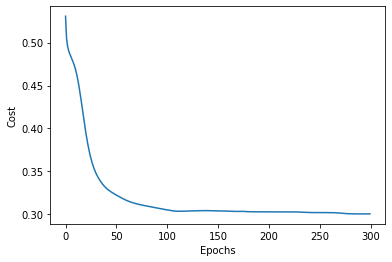

In [11]:
import matplotlib.pyplot as plt

plt.plot(range(nn.epochs), nn.eval_['cost'])
plt.ylabel('Cost')
plt.xlabel('Epochs')
#plt.savefig('images/12_07.png', dpi=300)
plt.show()

In [13]:
y  = nn.predict(X_train)
y

array([[2.04115373e-21],
       [0.00000000e+00],
       [9.99999999e-01],
       ...,
       [1.00000000e+00],
       [0.00000000e+00],
       [0.00000000e+00]])

In [14]:
y_train

array([[ 0.34715426],
       [ 0.00728582],
       [ 0.5359701 ],
       ...,
       [ 1.077242  ],
       [-0.48835567],
       [-0.42069668]], dtype=float32)